## Cognitive, Behavioral and Social Data Project: PID-5 Personality
Authors: Dacia Braca, Roberto Russo & Ivan Kulazhenkov

#### Project Introduction

We are investigating the honest and dishonest responses to the DSM-5(PID-5) personality inventory. 
<br>
The 'personality inventory' is a adult 25-item self-rated personality trait assessment scale for adults. It assesses 5 personality trait domains including negative affect, detachment, antagonism, disinhibition and psychoticism, each of these trait domains consists of 5 items; totally 25 sub categories in total.
<br>
This work book is divided into the following sections

#### Content

* Imports and helper functions
* 1. Data preparation
    * 1.1 Raw dataset creation
* 2. Feature analysis
    * 2.1 Random Forest Feature Importance
    * 2.2 Principal Component Analysis
* 3. Raw Data - Model Selection and Tuning
    * 3.1 Raw Data - Classifier Performance Comparison
    * 3.2 Raw Data - Model Parameter selection and Cross Validation
* 4. Raw Data - Model Evaluation
    * 4.1 Raw Data - 5 Time Stratified K Fold
    * 4.2 Raw Data - Model Evaluation on Test Set
    * 4.3 Raw Data - Model Evaluation Results and Visualisations 
* 5. TF-IDF - Classification Section
    * 5.1 TF_IDF - Exploratory Data Analysis
    * 5.2 TF-IDF - Classification
    * 5.3 TF-IDF - Results
* 6. Honest response reconstruction
    * 6.1 Dataset Creation
    * 6.2 Naive Approach Training & Evaluation
    * 6.3 Denoising Autoencoder Training & Evaluation
    * 6.4 Multi Output Classifier Training & Evaluation
    * 6.5 Overall Reconstruction Results Analysis

* Concluding Points

#### Main sections and experiments carried out

- Feature Engineering and classification with raw questionnaire data

- TF IDF for detecting faked questionnaires and responses

- Unsupervised learning and clustering with HDBSCAN

- Questionnaire Reconstruction: Naive, Denoiser AE and Multi-output Classifier
<br>

Methodology for each experiment will be described in each respective section.

##### Imports 

In [2]:
!pip install pycaret
!pip install hdbscan
#using pycaret may require upgrading numpy
!pip install --upgrade numpy

     |████████████████████████████████| 301 kB 26.1 MB/s 
     |████████████████████████████████| 56 kB 4.5 MB/s 
     |████████████████████████████████| 86 kB 5.6 MB/s 
     |████████████████████████████████| 167 kB 55.4 MB/s 
     |████████████████████████████████| 261 kB 53.5 MB/s 
     |████████████████████████████████| 1.7 MB 51.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 6.8 MB 61.7 MB/s 
     |████████████████████████████████| 2.0 MB 49.3 MB/s 
     |████████████████████████████████| 114 kB 56.3 MB/s 
     |████████████████████████████████| 15.5 MB 46.7 MB/s 
     |████████████████████████████████| 1.3 MB 66.1 MB/s 
     |████████████████████████████████| 102 kB 11.5 MB/s 
     |████████████████████████████████| 636 kB 73.6 MB/s 
     |████████████████████████████████| 303 kB 76.9 MB/s 
     |████████████████

     |████████████████████████████████| 6.4 MB 19.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311891 sha256=54c9b4526fffcacd2f0fcf15ff20fc851eb6406a663abbd9f1553d9e3a7e91f3
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan
  Using cached numpy-1.21.5-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.7 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.21.5 which is incompa

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.express as px
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict, StratifiedKFold, train_test_split
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import model_selection
from sklearn.preprocessing import StandardScaler,MinMaxScaler, PowerTransformer, LabelBinarizer, normalize
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, auc, roc_curve, mean_squared_error
from sklearn.multioutput import MultiOutputRegressor, RegressorChain, MultiOutputClassifier, ClassifierChain
from hdbscan import HDBSCAN
import xgboost as xgb 
from scipy.stats import mode
import tensorflow as tf
from tensorflow import keras

#All additonal imports to be added here

##### Helper Functions

In [ ]:
#All functions to be added here


## 1. Data Preparation - Raw Dataset

#### 1.1 Raw Dataset Creation
To create a performant raw dataset we knew that we would have to perform some feature engineering in order to achieve the required results.

We first of all created a target column and did a reference check to identify the total number of rows belonging to each class in the dataset.



In [2]:
#Import dataset and rename condition of the patient to target response
df = pd.read_csv('PID5_df.csv',sep=';')
df.rename({'CONDITION' : 'target'}, axis=1, inplace=True)

In [ ]:
#Check lengths of all constituent classes including
# H for Honest
# D for dishonest
# P for actual pathological responses

total_h = len(df[df.target == 'H'])
total_d = len(df[df.target == 'D'])
total_p = len(df[df.target == 'P'])
print(f"Total of honest responses: {total_h}")
print(f"Total of fake responses: {total_d}")
print(f"Total of pathological responses: {total_p}")

Total of honest responses: 412
Total of fake responses: 412
Total of pathological responses: 100


Below we have a visual representation of the mean responses in each question split by each type of individual.

After looking at many visualizations of the data set we believe the one below gives the best first glance information. Not only do we see the response we should expect for each question but we also can easily see which questions have the biggest response variety for each class.

Two examples of the above are Question 12 and Question 18 where the mean can already help us distinguish between honest and dishonest responses.

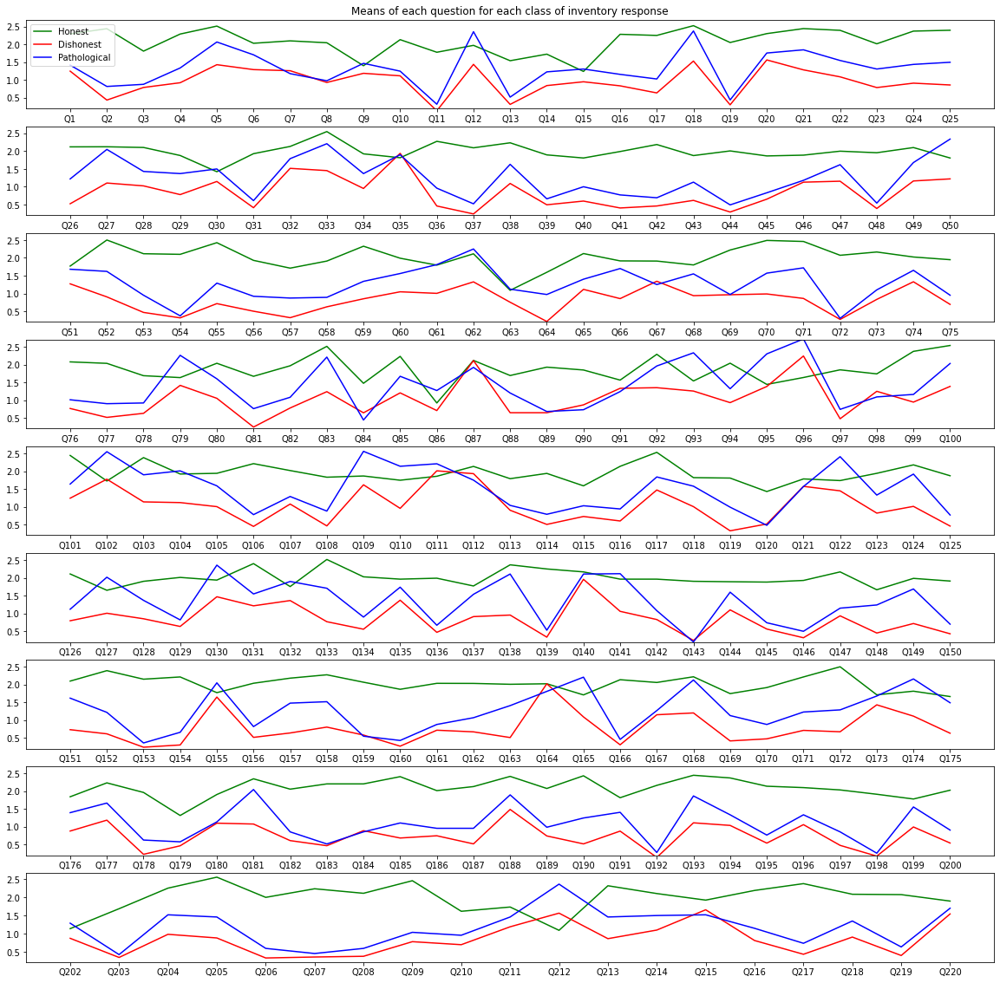

In [ ]:
# create a dataframe with means over all the subjects for each question 
means_per_question = pd.DataFrame(df.groupby(by = 'target').mean()).reset_index(drop=True)

# plot means for each question seperated by type of response
fig, axes = plt.subplots(9, figsize = (20,20))
colors = ['green', 'red', 'blue']

# Plot all the mean lines per patient
for pnt in [0,1,2]:
    mean = means_per_question.loc[pnt]
    for idx in range(0,8):
      axes[idx].plot(mean[idx*25:(idx+1)*25], color = colors[pnt])
      axes[idx].set_ylim([0.2, 2.7])
      
    axes[8].plot(mean[201:], color = colors[pnt])
    

axes[0].legend(['Honest','Dishonest','Pathological'],loc='upper left')
axes[0].set_title('Means of each question for each class of inventory response')

plt.show()

Next we proceed with feature engineering.

From the instructions provided to the personality test reviewer we knew that the scores of certain questions needed to be reversed to achieve a correct score calculation.

We have since been informed that the scores have already been reversed but in case of changes the code remains commented out below.

In [ ]:
# #Question numbers that need to be reversed
# questions_reverse = ['Q7','Q30','Q35','Q58','Q87','Q90','Q96','Q97','Q98','Q131','Q142','Q155','Q164','Q177','Q210','Q215']

# for i in questions_reverse:
#     #Assign new values to not disturb old ones
#     df.loc[df[i] == 0, i] = 7
#     df.loc[df[i] == 1, i] = 6
#     df.loc[df[i] == 2, i] = 5
#     df.loc[df[i] == 3, i] = 4
#     #Return value to reverse originals
#     df.loc[df[i] == 7, i] = 3
#     df.loc[df[i] == 6, i] = 2
#     df.loc[df[i] == 5, i] = 1
#     df.loc[df[i] == 4, i] = 0

Our next step was the creation of new features derived from the raw data that we had.

These feature engineering methods were divided into two categories:

1. Descriptive statistics which in our case included total point scores for all 220 question's. We also calculated total counts of each value that a respondee gave. For example how many threes were responded or how many zero values. 

2. We also performed a variation of the psychological examination that will be carried out on the back of the questionnaire. To achieve this we only used the 5 grouped domains rather than each individual personality trait. We tested using each individual personality trait and observed significant feature bloat and over fitting causing poor results at the validation phase. 

The 5 grouped domains are as follows:
- Negative affect
- Detachment
- Antagonism
- Disinhibition
- Psychoticism

In [ ]:
#Feature engineering to help with classification

#Relabel categorical target values to numeric e.g. Honest = 0 and Dishonest = 1
df.target, mapping_index = pd.Series(df.target).factorize()
#Remove pathological patient responses from the dataset
raw_df = df.loc[df['target'] != 2]
clean_raw_df = raw_df.copy()

#Record true sum of question points
raw_df.insert(220,'sum',raw_df.sum(axis=1))
#Record true count of each three response
raw_df.insert(221,'total_threes',raw_df.eq(3).sum(axis=1))
raw_df.insert(221,'total_twos',raw_df.eq(2).sum(axis=1))
raw_df.insert(221,'total_ones',raw_df.eq(1).sum(axis=1))
raw_df.insert(221,'total_zeros',raw_df.eq(0).sum(axis=1))

In [ ]:
#1 Create negative effect column
negative_effect = ['Q18', 'Q62', 'Q102', 'Q122', 'Q138', 'Q165',
 'Q181','Q79', 'Q93', 'Q95', 'Q96', 'Q109', 'Q110', 'Q130',
  'Q141', 'Q174','Q12', 'Q50', 'Q57', 'Q64', 'Q127', 'Q149', 'Q175']

raw_df.insert(221,'Negative Effect',raw_df[negative_effect].sum(axis=1))

#2 Create detachment column
detachment = ['Q10', 'Q20', 'Q75', 'Q82', 'Q136', 'Q146', 'Q147', 'Q161',
 'Q182', 'Q186', 'Q1', 'Q23', 'Q26', 'Q30', 'Q124', 'Q155', 'Q157',
  'Q189', 'Q89', 'Q97', 'Q108', 'Q120', 'Q145', 'Q203']

raw_df.insert(221,'Detachment',raw_df[detachment].sum(axis=1))

#3 Create antagonism column
antagonism = ['Q107', 'Q125', 'Q162', 'Q180', 'Q219', 'Q41', 'Q53', 'Q56',
 'Q76', 'Q126', 'Q134', 'Q142', 'Q206', 'Q214', 'Q218','Q40',
  'Q65', 'Q114', 'Q179', 'Q187', 'Q197']

raw_df.insert(221,'Antagonism',raw_df[antagonism].sum(axis=1))

#4 Create disinhibition column
disinhibition  = ['Q31', 'Q129', 'Q156', 'Q160', 'Q171', 'Q201',
 'Q210', 'Q4', 'Q16', 'Q17', 'Q22', 'Q58', 'Q204', 'Q6', 'Q29',
  'Q47', 'Q68', 'Q88', 'Q118', 'Q132', 'Q144', 'Q199']

raw_df.insert(221,'Disinhibition',raw_df[disinhibition].sum(axis=1))


#5 Create psychoticism column
psychoticism  = ['Q94', 'Q99', 'Q106', 'Q139', 'Q143', 'Q150', 'Q194',
 'Q209', 'Q5', 'Q21', 'Q24', 'Q25', 'Q33', 'Q52', 'Q55', 'Q70', 'Q71',
  'Q152', 'Q172','Q185', 'Q205', 'Q36', 'Q37', 'Q42', 'Q44', 'Q59',
   'Q77', 'Q83', 'Q154', 'Q192', 'Q193', 'Q213', 'Q217']

raw_df.insert(221,'Psychoticism',raw_df[psychoticism].sum(axis=1))

After adding the new features we recounted the number of testable features.

We stored this value as well as the column names of all features. 

These will be used during feature selection and PCA analysis.

In [ ]:
#Number of testable features we are using
raw_feature_end = raw_df.shape[1] - 1
print('Total features we are using: ', raw_feature_end)

#Record column names
raw_names = list(raw_df.columns.values)

Total features we are using:  230


##### Data Transformation

In all of our calculated features we observed skewness. Upon plotting the distrubtion we saw many long tailed distributions from the created features.

We decided to use the 'Yeo-Johnson' power transformation to transform our numeric variables to make them more normally distributed.

After applying the 'Yeo-Johnson' transformation we noticed a marked decrease in skewness. This will be seen later on in the pairwise distribution plot.

The features can also be more easily linearly seperated due to this transformation.

The transformation for the 'Yeo-Johnson' can be seen below:

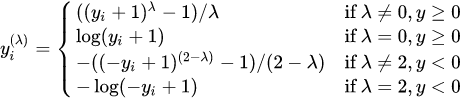

Critically in our case the Yeo–Johnson transformation allows also for zero values of y. λ can be any real number, where λ = 1 produces the identity transformation.

In [ ]:
# Power transformation using the yeo-johnson method
# Only for numeric calculated features
pt = PowerTransformer(method="yeo-johnson")
data = pt.fit_transform(raw_df.values[:, 220:230])

rest_raw_df =pd.DataFrame(raw_df.values[:,  0:220], columns=raw_df.iloc[:, 0:220].columns)
transformed_df_features = pd.DataFrame(data, columns=raw_df.iloc[:, 220:230].columns)
df_labels = raw_df.iloc[:, raw_feature_end]

raw_df = pd.concat([rest_raw_df, transformed_df_features, df_labels], axis=1, names=list(raw_df.columns))


After performing the data transformation and bein ghappy with our final feature set. We went ahead to create the X and Y data, label sets for the raw engineered question data.



In [ ]:
#Split into data and labels
X_raw = raw_df.iloc[:, 0:raw_feature_end].values
Y_raw = raw_df.iloc[:, raw_feature_end].values

The below parameters will be used to select sub sets of features for model testing.

In [ ]:
#Raw dataset parameter generation
final_df = raw_df
X = X_raw
Y = Y_raw
names = raw_names
feature_end = raw_feature_end
indices = np.arange(raw_df.shape[0])


We tested a variety of train/test ratios.

For the final model test we used a ratio of 70/30.
We also tested 60/40,70/30,80/20,90/10

We oberved the most consistent performance in the 80/20 and 70/30 splits.

In [ ]:
# train is now 70% of the entire data set
# test is now 30% of the initial data set

train_ratio = 0.7

X_train, X_test, Y_train, Y_test, indices_train, indices_test = train_test_split(X, Y, indices, test_size=1 - train_ratio,random_state=0, stratify=Y)

##### Z - Score

The value of the Z-score tells us how many standard deviations the feature set is away from the mean. If a Z-score is equal to 0, it is on the mean.

In our case almost all of our data lies within +-3 standard deviations of the mean. This means among other things that we have few outliers. 

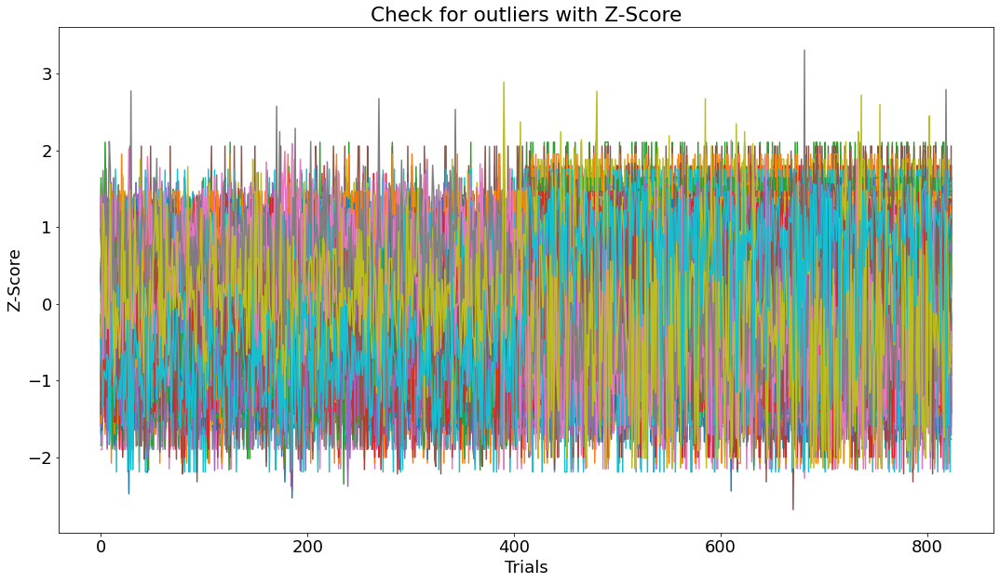

In [ ]:
z = stats.zscore(raw_df.iloc[:, 0:raw_feature_end].values)
plt.figure()
plt.rcParams["figure.figsize"] = (18, 10)
for i in range(raw_feature_end):
    plt.plot(z[:, i])
plt.rcParams.update({"font.size": 18})
plt.title("Check for outliers with Z-Score")
plt.xlabel("Trials")
plt.ylabel("Z-Score")
plt.show()

##### Outlier Removal for the data

Even though our data is not too affected by outliers we produced some code to to test their removal on classification performance.

Below we have optional code to perform outlier removal for the dataset. However, since most of the data is contained in 3 standard deviations we decided not to reduce our dataset further.

In actual fact including the outlier removal proved detrimental to the performance with a loss of around ~0.7% accuracy in classification accuracy.

In [ ]:
  hon_df = raw_df[raw_df.target==0].iloc[:, 0:feature_end]
  dhon_df = raw_df[raw_df.target==1].iloc[:, 0:feature_end]

  #We take below 0.01 and above 0.99 for honest
  low = 0.01
  high = 0.99
  quant_df_hon = hon_df.quantile([low, high])
  hon_df_no = hon_df.apply(
      lambda x: x[(x > quant_df_hon.loc[low, x.name]) & (x < quant_df_hon.loc[high, x.name])],
      axis=0,
  )




  #We take below 0.01 and above 0.99 for dishonest
  low = 0.01
  high = 0.99
  quant_df_dhon = dhon_df.quantile([low, high])
  dhon_df_no = dhon_df.apply(
      lambda x: x[(x > quant_df_dhon.loc[low, x.name]) & (x < quant_df_dhon.loc[high, x.name])],
      axis=0,
  )


  #Combine to create final dataframe with no outliers
  outlier_gone_df = pd.concat([hon_df_no, dhon_df_no])

## 2. Feature Analysis

#### 2.1 Random Forest Feature Importance

Feature importance/selection is an important technique in machine learning. Finding feature importance scores can providce more insight into the raw and engineered data as they highlight which features are most and least relevant to classify the target classes.

We implemented a random forest classifier to find out what are the most useful questions and engineered features for classifiying whether a personality inventory respondee was honest or dishonest. 



With this in mind we computed the top 20 features in the dataset,
<br>
We wanted to not only see the best original features but also compare the strength of our engineered features.

In [ ]:
#Feature Importance and selection with Random Forest - top 20
fit_rf = RandomForestClassifier(n_estimators=100)
fit_rf.fit(X_train,Y_train)
 
importance_rf  = fit_rf.feature_importances_
indices_rf = np.argsort(importance_rf)

names = names[0:feature_end]

feature_num = 20


To select features for classification using Random Forest, the metric we measure is called the Gini impurity or the information gain.

A feature selection based on Gini impurity/ importance, is even more useful when preceding a principal component analysis for a  linear classification. This is because the Random Forest is able to identify an optimal subset of features, and through that after gives the benifit of both dimensionality reduction and the elimination of noise from the data.

With this in mind below we have a plot showing the importance of 20 features identified as most signnificant

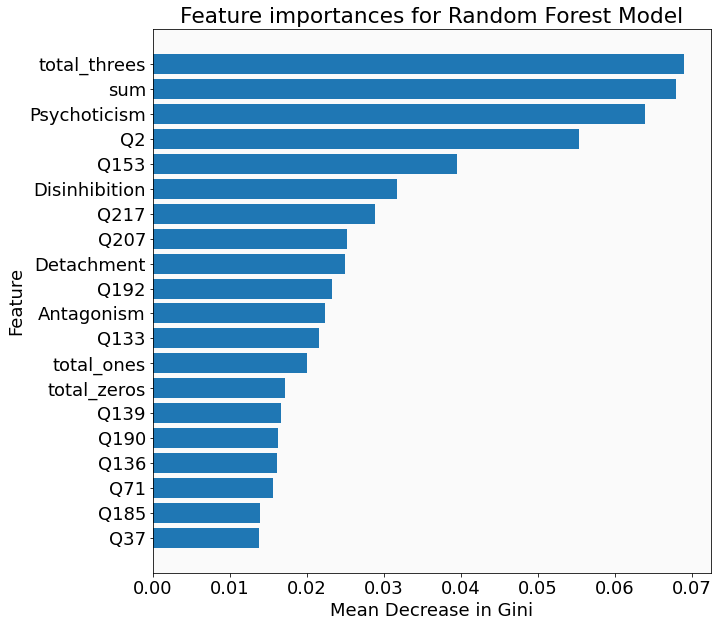

In [ ]:
#Plot most important features
fig, ax = plt.subplots(figsize=(10, 10))

ax.set_facecolor("#fafafa")
plt.title("Feature importances for Random Forest Model")
plt.barh(range(feature_num),importance_rf[indices_rf[-feature_num:]], align="center")
plt.yticks(range(feature_num), [names[i] for i in indices_rf[-feature_num:]])

# plt.ylim(-1, feature_end)
# plt.xlim(0, max(importance_desc))
plt.xlabel("Mean Decrease in Gini")
plt.ylabel("Feature")

plt.show()
plt.close()

##### Pair Wise Correlation Plot for our non-question based data

As previously mentioned in the discussion surrounding the 'Yeo-Johnson' method. By using the power transformation we were able to obtain a linearly seperable class split for most of our engineered features. Evidence for this can be seen in the pair wise plot generated below.

The plot additonally shows the correlation between the different engineered features. This shows us some limited information regarding inter-feature relationships; nevertheless, this will serve us well when understanding how the principal component analysis is working. As well as why it is selecting the components it does.

In [ ]:
# column_features = ['sum', 'total_zeros', 'total_ones', 'total_twos','total_threes']

features = final_df[final_df.columns[220:230]]
labels = final_df.iloc[:, -1:]
feature_df = pd.concat([features, labels], axis=1)

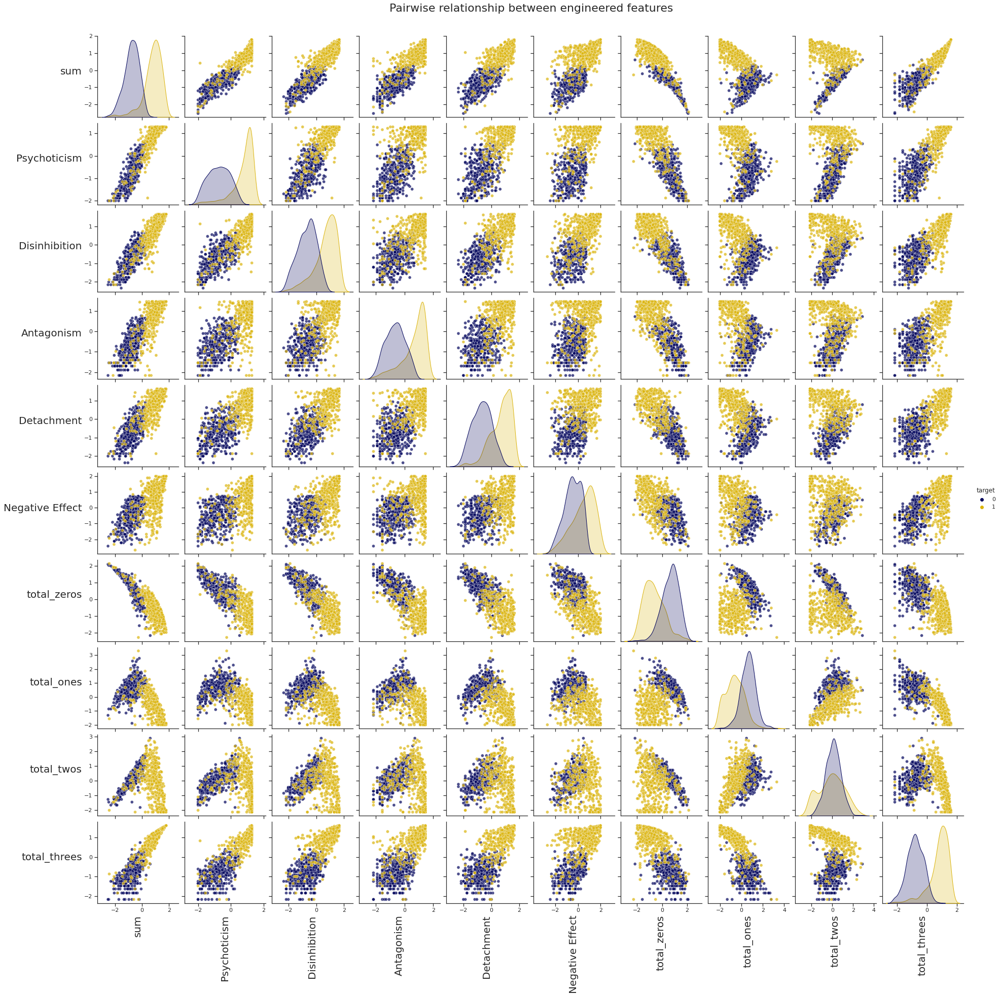

In [ ]:
sns.set(style="ticks", color_codes=True);# Create a custom color palete
palette = sns.xkcd_palette(['dark blue','gold'])# Make the pair plot with a some aesthetic changes
g = sns.pairplot(feature_df, hue = 'target', diag_kind = 'kde', palette= palette, plot_kws=dict(alpha = 0.7),
                   diag_kws=dict(shade=True))
g.fig.suptitle("Pairwise relationship between engineered features", y=1.02, fontsize = 22)
for ax in g.axes.flatten():
    
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90, fontsize = 20)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0, fontsize = 20)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')

Correlation Plot
In addition to the pair plot above we created a correlation matrix (using Pearson correlation coefficient) to show the correlations between the 10 engineered features that we created.

Below we can see more clearly the relationships demonstrated in the pair plot above. We will use these correlations to group features and perform dimensionality reduction.

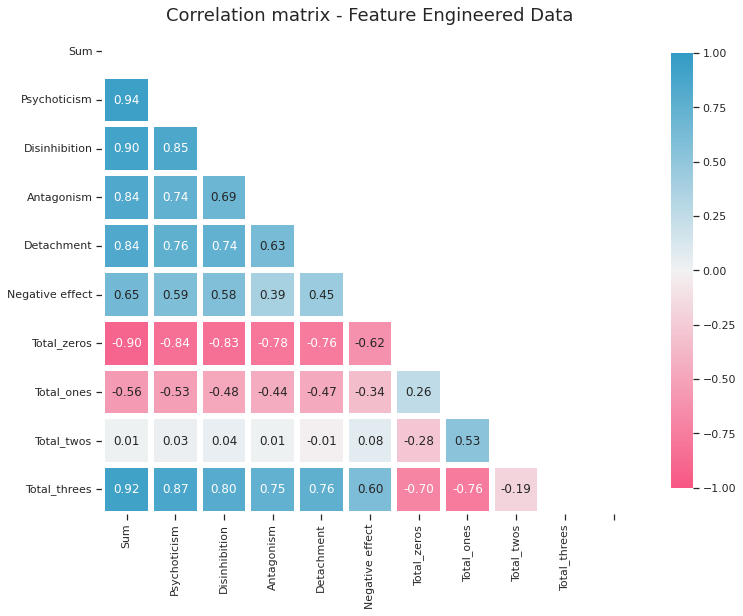

In [ ]:
# Calculate Pearson's correlation coefficient
df_corr = feature_df.corr(method='pearson')


#Create numerical correlation chart
fig, ax = plt.subplots(figsize=(12, 10))
# mask
mask = np.triu(np.ones_like(df_corr, dtype=np.bool_))
# adjust mask and df
mask = mask[:-1]
corr = df_corr.iloc[:-1].copy()
# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)
# plot heatmap
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
           linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
           cbar_kws={"shrink": .8}, square=True)
# ticks
yticks = [i.capitalize() for i in corr.index]
xticks = [i.capitalize() for i in corr.columns][:-1]
plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks)
# title
title = 'Correlation matrix - Feature Engineered Data'
plt.title(title, loc='center', fontsize=18)
plt.show()

#### 2.2 Principal Component Analysis

PCA aims to find linearly uncorrelated orthogonal axes. These are also known as the principal components that underpin PCA. 

With PCA we attempt to find linear combinations of features in the original high dimensional matrix formed from the dataset of features. Ultimately we want to reduce the dimension of dataset whilst maintaining the largest variance.

Principal Components can be determined via eigen decomposition of a covariance matrix. In this case(C)

cov_mat.png

Since our main purpose is to perform dimensionality reduction, we can project all of the points coming from our data onto the required k PCs and get a still high quality representation of the data:

pc_project.png

What we can see below is a biplot. The biplot can plot for each feature its contribution by its angle and length of the vector. The first graph below shows how much variance is explained by each individual component. The second and the third graph are known as the score plot and the loadings plot.

Usefully the score plot shows similarities between observations. In this plot points close to each other in the plot represent observations with similar values. 

The last plot (vector plot) below is also highly interesting. The cosine of the angles between vector pairs show correlations between variables. Also highly correlated variables point in similar directions and uncorrelated variables are clsoe to being perpendicular to each other 

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=e2eb277d92ddc9e4bfc30b87489aaec579ef03cf969a91ef57bd889be6c87f93
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
[pca] >Processing dataframe..
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fitting using PCA..
[pca] >Computing loadings and PCs..
[pca] >Computing explained variance..
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


<Figure size 864x864 with 0 Axes>

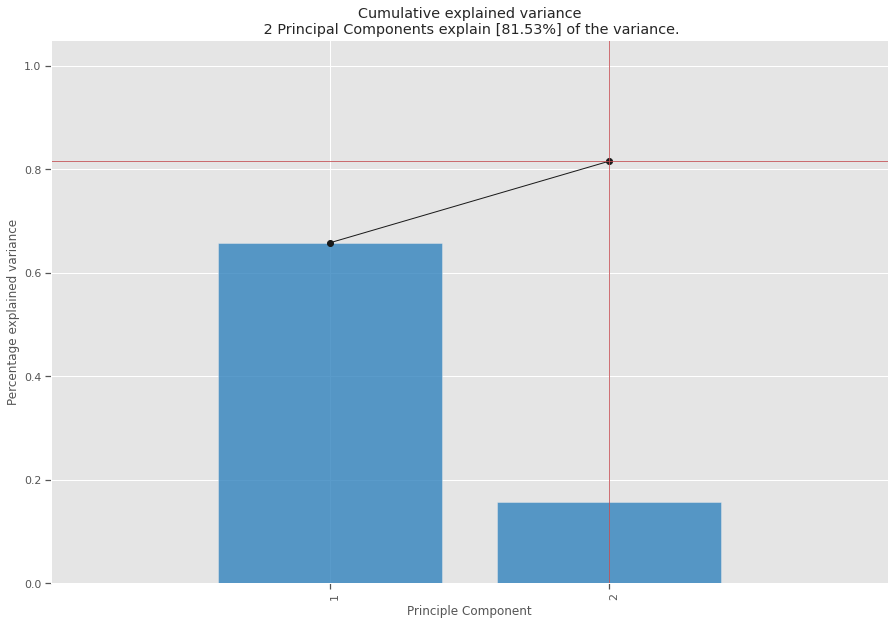

[pca] >Plot PC1 vs PC2 with loadings.


<Figure size 1296x720 with 0 Axes>

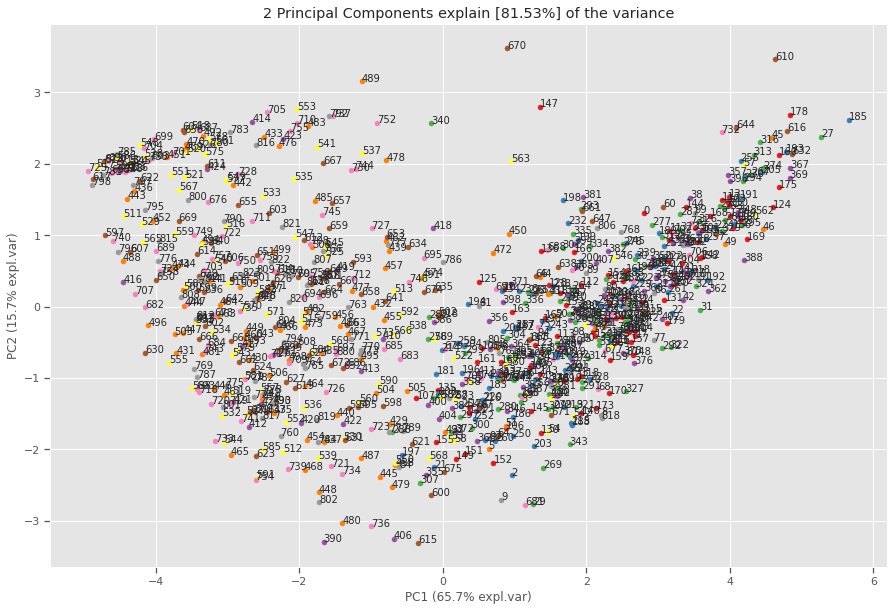

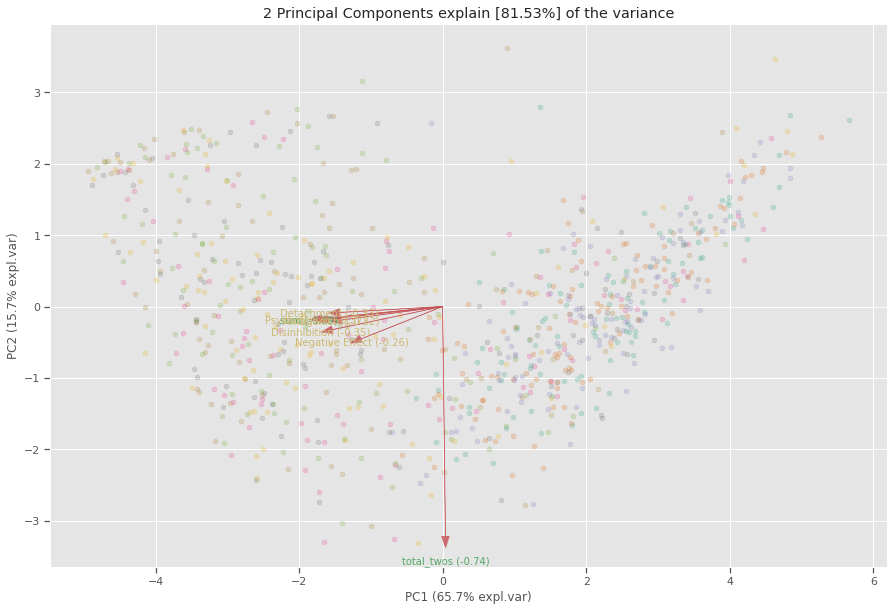

In [ ]:
!pip install pca
plt.style.use("ggplot")
from pca import pca

# Get biplot to visualise PCA scores of the samples (dots)
# Reduce the data towards 2 PCs
model = pca(n_components=2)

# Fit transform
results = model.fit_transform(feature_df.iloc[:, 0:10])

fig = plt.figure(figsize=(12, 12))
# Plot explained variance
fig, ax = model.plot()

# Scatter first 2 PCs
fig, ax = model.scatter(legend=False)

# Make biplot with the number of features
fig, ax = model.biplot(n_feat=7, legend=False,alpha_transparency=0.2,label=False,cmap='Dark2')


The plot below shows the singular values corresponding to each of the selected principal components 

Text(0.5, 1.0, 'PCA')

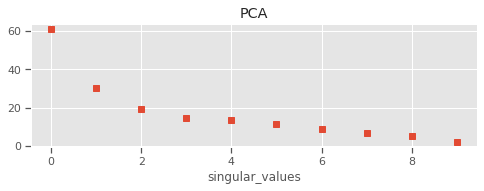

In [ ]:
# Check singular values (only 7 features selected by Random Forest)
pca = PCA()
pca.fit(feature_df.iloc[indices_train, :].drop(columns="target").to_numpy())
V = pca.transform(feature_df.iloc[indices_train, :].drop(columns="target").to_numpy())

plt.figure(figsize=(8, 5))
plt.subplot(211)
plt.plot(pca.singular_values_, "s")
plt.xlabel("singular_values")
plt.title("PCA")

With PCA, the importance of each feature is reflected by the magnitude of the corresponding values in the eigenvectors (higher magnitude means higher importance)

Below we can see the combinations of engineered features that the PCA has selected for its first two components

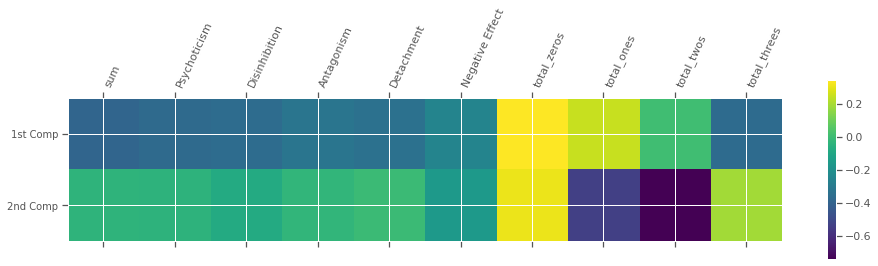

In [ ]:
# Feature importance using PCA
plt.matshow(pca.components_[0:2], cmap='viridis')
plt.yticks([0,1], ['1st Comp','2nd Comp'], fontsize=10)
plt.colorbar()
plt.xticks(range(len(feature_df.drop(columns="target").columns)), 
           feature_df.drop(columns="target").columns, rotation=65, ha='left')
# plt.tight_layout()
plt.show()

## 3. Raw Data - Model Selection and Tuning

#### 3.1 Raw Data - Classifier Performance Comparison

This step of the analysis aims at designing a robust test harness for evaluation of several standard machine learning algorithms. The evaluation applies this set of algorithms to our PID-5 data and selects the best performing algorithm. 

Here is a list of the standard machine learning algorithms that we considered.
- Logistic Regression
- Linear Discriminant Analysis
- k-Nearest Neighbours
- Decision Tree (CART)
- Gaussian Naive Bayes
- Support Vector Machine
- Multilayer Perceptron
- Ada Boost


For each of these classifiers, different parameters and regularisation techniques have been tuned and tested in order to obtain the best performance.

The idea behind this section was to create a flexible testing harness through which we could test any number of models simply and easily. Once a model became implemented the tuning section would ensure that the necessary validation steps were in place so that model comparison was done effectively and fairly. 

The results of this evaluation are at the end of this sub section

Before we began classification we first of all performed scaling and tranformation on the data.
This prepared the dataset to be inputted into our cross validation test harness.

In [ ]:
#Perform scaling and transformation on the training data set.
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_transform = scaler.transform(X_train)
index = indices_rf[0:feature_end]
X_train_transform = X_train_transform[:, index]

In this section we create a list of models to be tested with the transformed dataset. 
Usefully for us this list of  models is easy to add to as well as allowing rapid comparison between individual algroithms.


In [ ]:
# prepare configuration for cross validation test harness
seed = 0
# prepare models
models = []
models.append(
    (
        "LR",
        LogisticRegression(
            solver="lbfgs", max_iter=500, class_weight="balanced", multi_class="auto"
        ),
    )
)
models.append(("LDA", LinearDiscriminantAnalysis()))
models.append(("KNN", KNeighborsClassifier()))
#models.append(("KM",KMeans()))
models.append(("NC", NearestCentroid()))
models.append(("CART", DecisionTreeClassifier()))
models.append(("NB", GaussianNB()))
models.append(("SVM", SVC(gamma="auto", class_weight="balanced")))
models.append(("RF", RandomForestClassifier(n_estimators=200, class_weight="balanced")))
models.append(("ADA", AdaBoostClassifier(n_estimators=200)))



Here we can see a set of textual results for all the models defined above.

To get an indicative evaluation of the models performance we used 5 k fold validation to get a mean result as well as the deviation for each of the models.

In [ ]:
# evaluate each model in turn
results = []
names = []
results_t = []
names_t = []
scoring = "accuracy"

print('Model Performance over 5 KFold splits')
print('-------------------------------------')
for name, model in models:
    kfold = model_selection.KFold(n_splits=5)
    cv_results = model_selection.cross_val_score(
        model, X_train_transform, Y_train, cv=kfold, scoring=scoring
    )
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())

    print(msg)

Model Performance over 5 KFold splits
-------------------------------------
LR: 0.961799 (0.013031)
LDA: 0.916612 (0.018063)
KNN: 0.927121 (0.024814)
NC: 0.935772 (0.017872)
CART: 0.901019 (0.021103)
NB: 0.942729 (0.016956)
SVM: 0.954888 (0.013796)
RF: 0.947946 (0.015422)
ADA: 0.944468 (0.020936)


Below is a better visualiation of the models performance as we have box and whisker plots for all the models that we tested above.

As we can see from the numerics above and the visualization below there are some standout performers among the models and some which can be discarded from further testing.

The models which we continued evaluating were the SVM, Logistic Regression, Random Forest and Ada Boost. The next step in their evaluation was performing a grid search parameter tune. This will be investigated further in the next section of the notebook.

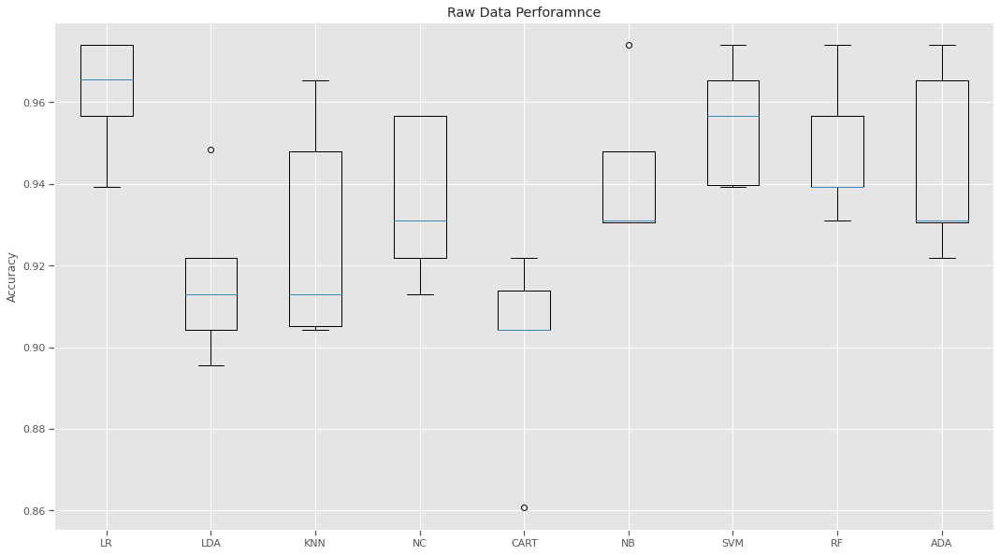

In [ ]:
# boxplot algorithm comparison
fig = plt.figure()
plt.rcParams['figure.figsize'] = (12,5)
# fig.suptitle("ML Algorithm Comparison")
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
ax.set_title('Raw Data Perforamnce')
ax.set_ylabel('Accuracy')
plt.show()

#### 3.2 Raw Data - Model Parameter selection and Cross Validation

In the section above we have selected the best models. Since we were testing on raw data only we will perform the hyper parameter selection and tuning on the same raw data. As alluded to above the models that we will be tuning are the SVM, Random Forest, ADA and Logistic regression. 

In the cells below we generated a list of estimator steps prior to initialising the parameter grid that we tested. To limit the computation time required for the grid search to run we chose only one mthod per execution.

This meant that we tested each one of our algorithms seperately. Even though this shrank the execution time significantly we would still not recommend running the below cells without commenting out some of the parameter options. Otherwise, this could result in execution times in the range ~30 mins to ~2 hours.

For all the models we tested variable numbers of top random forest features combined with number of principal component.

In addition here is a brief summary of the unique hyper parameters we tested:



1. Logistic Regression
  - C: we varied the regularization strength during model fit. The smaller the value the stronger the regularization. 
2. SVM
  - Kernel: Specifies the kernel type to be used in the algorithm.
  - C: we varied the regularization strength during model fit. The smaller the value the stronger the regularization.
3. Ada Boost
  - Learning Rate: We varied the learning rate as applied at each iteration.
  - N Estimators: The maximum number of estimators at which boosting finishes. If perfecting learning is achieved the boosting stops early.
  
4. Random Forest
  - N Estimators: For random forest this specifies the number of trees in the forest.
  - Max Depth: This parameter varies the maximum depth of the tree.


Below is an example execution for the SVM model.




In [ ]:
#Model Select
method = "SVM"


#Initiate estimators
estimators = []
estimators.append(("standardize", MinMaxScaler()))
estimators.append(('features_importance', SelectFromModel(fit_rf)))
estimators.append(("pca", PCA()))

In [ ]:
if method == "LR":
    estimators.append(
        (
            "logistic",
            OneVsRestClassifier(
                LogisticRegression(
                    class_weight="balanced", solver="lbfgs", max_iter=2000
                )
            ),
        )
    )
    param_grid = {
        # 'features_importance__max_features': [1,50,100,150,200],
        # "pca__n_components": [i + 1 for i in range(11)],
        # "pca__n_components": [i+1 for i in range(feature_end)],
        "pca__n_components": [1,50,100,150,200,feature_end],
        "logistic__estimator__C": [10,  1, 0.001],
    }

elif method == "SVM":
    # hyperparameter selection
    estimators.append(
        (
            "SVM",
            OneVsRestClassifier(
                SVC(gamma="auto", probability=True, class_weight="balanced")
            ),
        )
    )
    param_grid = {
        'features_importance__max_features': [i + 11 for i in range(11)],
        "pca__n_components": [i + 1 for i in range(11)],
        # "pca__n_components":  [i+1 for i in range(feature_end)],
        "SVM__estimator__C": [0.1, 1, 10],
        "SVM__estimator__kernel": ["rbf", "linear"],
    }
    
elif method == "RF":
    estimators.append(
        (
            "RF",
            OneVsRestClassifier(
                RandomForestClassifier(random_state=42, class_weight="balanced")
            ),
        )
    )
    param_grid = {
        'features_importance__max_features': [i + 1 for i in range(11)],
        "pca__n_components": [i + 1 for i in range(11)],
        # "pca__n_components":  [i+1 for i in range(feature_end)],
        "RF__estimator__n_estimators": [100, 500],
        # "RF__estimator__min_samples_leaf": [1, 10],
        "RF__estimator__max_depth": [10, 30, 50],
    }

elif method == "ADA":
    estimators.append(
        (
            "ADA",
            OneVsRestClassifier(
                AdaBoostClassifier(RandomForestClassifier(n_estimators=200))
            ),
        )
    )
    param_grid = {
        # 'features_importance__max_features': [i + 1 for i in range(11)],
        # "pca__n_components": [i + 1 for i in range(11)],
        # "pca__n_components":  [i+1 for i in range(feature_end)],
        "ADA__estimator__learning_rate": [0.01, 0.001],
        "ADA__estimator__n_estimators": [20,  60, 100, 120],
        
    }

model = Pipeline(estimators)  # evaluate pipeline

Below is the code which performs the exhaustive grid search to find the best parameter combination. Upon completion the code spits out the best parameter combination through the last print statement.

In [ ]:
# HyperParameter Selection
search = GridSearchCV(
    model, param_grid, cv=5, return_train_score=False, scoring="roc_auc", verbose=1
)
search.fit(X_train, Y_train)
print("Best parameter (CV score=%0.3f):" % search.best_score_)
print(search.best_params_)

Fitting 5 folds for each of 726 candidates, totalling 3630 fits
Best parameter (CV score=0.979):
{'SVM__estimator__C': 10, 'SVM__estimator__kernel': 'rbf', 'features_importance__max_features': 17, 'pca__n_components': 11}


## 4. Raw Data - Model Evaluation

#### 4.1 Raw Data - 5 Time Stratified K Fold

The first sub section of the raw data evaluation performs a sanity check on the testing that we performed in the section above.

We ran a 5 fold stratified cross validation 10 times to ensure we obtained a good representative performance acros the entire training set.

Results are below.

In [ ]:
n_repeats = 10
best_pipeline = search.best_estimator_

accuracy_cv = np.zeros(n_repeats)

for i in range(n_repeats):
    Y_pred = cross_val_predict(
        best_pipeline, X_train, Y_train, cv=StratifiedKFold(5, shuffle=True)
    )
    accuracy_cv[i] = accuracy_score(Y_train, Y_pred)

print(
    "accuracy %0.3f (+/- %0.01g)"
    % (accuracy_cv.mean(), 1.96 * accuracy_cv.std() / np.sqrt(n_repeats))
)

accuracy 0.943 (+/- 0.002)


#### 4.2 Raw Data - Model Evaluation on Test Set

The following sub section contains the final evaluation of our selected model. Here we defined the final preprocessing pipeline that we used in the evaluation of our test data.

After considerable testing we found a model which atually outperformed the optimal model found by the parameter grid search.

Below we have the preprocessing pipeline for our final example model. Firstly, we would like to make a remark and state that many of the best models had a similar level of performance. In particular Logistic Regression came the closest to achieving a 98% weighted avereage accuracy. It do not however, manage to beat the SVM.

The method belows remains consistent with the method selected for parameter tunning above. As such it only adds one model to the pipeline.

The prediction results are then shown through a classification report, confusion matrix and ROC curve.

In [ ]:
#Create arrays for predictions and ground truths
# conf_matrix_list_of_arrays = []
groundtruth_labels = []
predicted_labels = []

# apply the pre-processing pipe-line
preprocess_pipeline = make_pipeline(MinMaxScaler(), PCA(n_components=23))
preprocess_pipeline.fit(X_train)
X_train_transformed = preprocess_pipeline.transform(X_train)
X_test_transformed = preprocess_pipeline.transform(X_test)

# create the models
if method == 'SVM':
    model = SVC(
        kernel = 'linear', C= 1, gamma="auto", probability=True, class_weight="balanced"
        )

if method == 'ADA':
    model = AdaBoostClassifier(
        RandomForestClassifier(n_estimators=200),learning_rate=0.01, n_estimators=60
    )

if method == 'RF':
    model =  RandomForestClassifier(
        max_depth=10,min_samples_leaf=1, n_estimators=500,bootstrap=True,class_weight="balanced"
    )
    
if method == 'LR':
    model = LogisticRegression(
        solver="lbfgs", max_iter=500, class_weight="balanced", multi_class="auto", C=10
    )


#Fit the model and generate the results
# fit the data
model.fit(X_train_transformed, Y_train)

# predictions on the validation data
predictions = model.predict(X_test_transformed)
groundtruth_labels.append(Y_test)
predicted_labels.append(predictions)

#### 4.3 Raw Data - Model Evaluation Results and Visualisations

Below wwe have the classification report for our best case result. 
This 98% is variable however, and would not stand up to scrutiny in the real world. A result of 96-97% would be much more reproducible. 

More data would definitely help in raising our confidence in the raw model's consistency.

In [ ]:
# Show classification report for model on the validation data
print(classification_report(np.concatenate(groundtruth_labels, axis=0), np.concatenate(predicted_labels, axis=0)))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98       124
           1       0.99      0.96      0.98       124

    accuracy                           0.98       248
   macro avg       0.98      0.98      0.98       248
weighted avg       0.98      0.98      0.98       248



Next we can see the confusion matrix of the results

As expected by us the model was almost perfect in prediting the honest responses. In fact it only made one mistake.

The rest of the mistakes the model made was when predicting dishonest ones. There were 5 respondees who were considered to have answered truthfully.

In our opinion, for this experiment it is more serious to mispredict a dishonest response rather than an honest one. We would have liked to see the reverse.

Nevertheless, the results are very good and given more data we could potentially be able to identify the liars even better.

Since we are also not certain of the manner in which liars responded to the personality inventory we cannot exclude the potential situation where the lie by chance resembled an honest response.

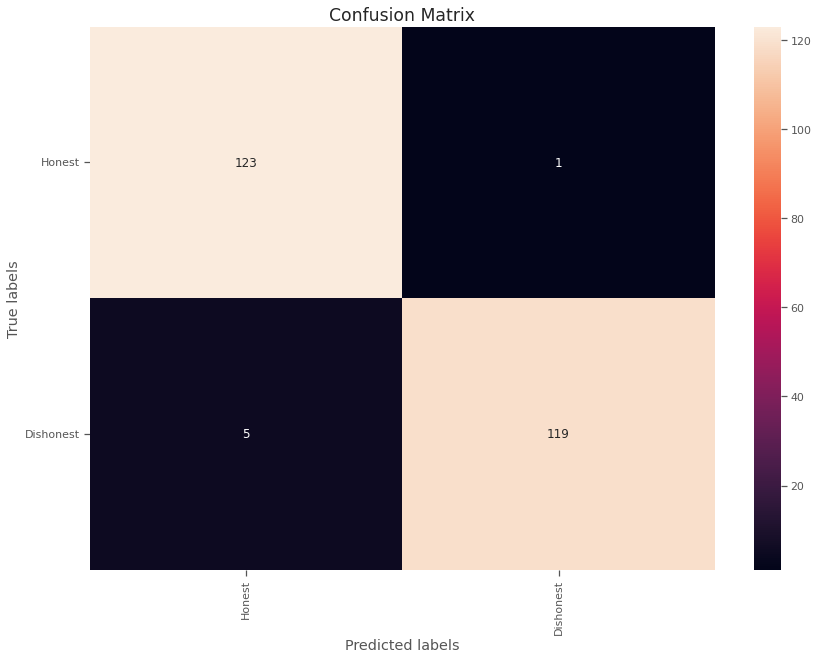

In [ ]:
# Make confusion matrix
cm = confusion_matrix(np.concatenate(groundtruth_labels, axis=0), np.concatenate(predicted_labels, axis=0))
labels = ['Honest','Dishonest']


# Plot the confusion matrix
plt.rcParams.update({"font.size": 12})
fig = plt.figure(figsize=(14, 10))
ax= plt.subplot()
sns.heatmap(cm.astype('float'), annot=True, ax=ax,fmt='g') 
# To show fractions, please uncomment the following line and comment the above
#sns.heatmap(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], annot=True, fmt='.2', ax=ax) 
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels, rotation=90)
ax.yaxis.set_ticklabels(labels, rotation=0)
plt.show()

The ROC curve below has been constructed by plotting the true positive rate  against the false positive rate. 

We can see there is a very small gap for trade off between the sensitivity (true positive rate) and specificity (1 - false positive rate).

This is extremely good and we can see that the line is almost at the top left hand corner of the plot. The top left hand corner of the plot wuold be an ideal discriminator.

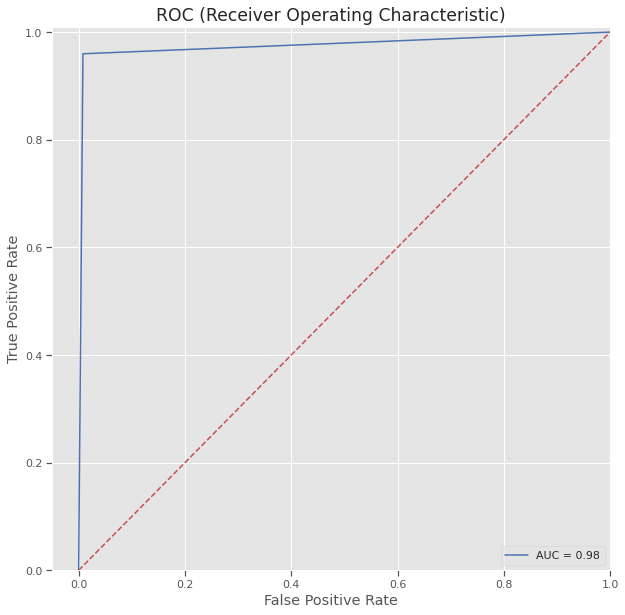

In [ ]:
# plot the ROC curve
lb = LabelBinarizer()
lb.fit(np.concatenate(groundtruth_labels, axis=0))

y_actual = lb.transform(np.concatenate(groundtruth_labels, axis=0))
y_pred = lb.transform(np.concatenate(predicted_labels, axis=0))

# Compute ROC curve and ROC area for each class

fpr, tpr, threshold = roc_curve(y_actual, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 10))
plt.title('ROC (Receiver Operating Characteristic)')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.05, 1])
plt.ylim([0.0, 1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## 5. TF-IDF Classification Section

#### 5.1 TF-IDF Dataset Creation

There are two ways to compute the TFIDF, the first one has the following formula $TFIDF_{ij}=k_{ij}*ln(N/n_{j})$
Where $k_{ij}$ is equal to thenumber of time a number a certain answer $(0, 1, 2, 3)$ has been given within the questionnaire $j$, $N$ is the number of questionnaires in the collection, and $n$ is the number of questionnaires that got the specific answer at the question $j$. In the second proedure $k_{ij}$ is just equal to the answer that has been given, $N$ is equal to $3*|collection|$ and $n_{ij}$ is equal to $k$ multiplied by the number of question $j$ that got $k$ as answer
The assumptions of the second procedure are that there are N collections where N is the number of questions in the questionnaire, and each collection is formed by all the answers to the same question. So if there are 1000 questionnaires with 10 questions, there will be 10 collections, one formed by 1000 answers to question number 1, one formed by 1000 the answers to question number 2, and so on. In this case, the documents of a collection correspond to all the answers to a specific question. The other assumption is that there is one “virtual” item, corresponding to one point of accordance with the sentence of the question, that can be assigned n times, with n between the minimum and the maximum number of the answer’s scale. We choose to work with the second procedure because it takes into account the ordinality of the scale, and as it will be shown later, give to the data a more useful structure for clustering and classification. 

In [ ]:
def compute_tf_idf(all_data, idfs=None, procedure=1):
    all_data = np.array(all_data)
    tfidfs = np.zeros_like(all_data)
    distinct_answ_values = np.unique(all_data)
    if procedure == 1:
      if idfs is None:
        idfs = np.ones(shape=(len(distinct_answ_values), all_data.shape[1])) * all_data.shape[0] #matrice degli N/n che può essere modificata
        for answ_value_idx in range(len(distinct_answ_values)):
          for answ_idx in range(all_data.shape[1]):
            unique, counts = np.unique(all_data[:, answ_idx], return_counts=True)
            if len(unique) < 4:
              cosa = list(unique)
              cosa.append(3)
              unique = np.array(cosa)

              cosa = list(counts)
              cosa.append(0.000001)
              counts = np.array(cosa)
            idfs[answ_value_idx][answ_idx] = np.log(idfs[answ_value_idx][answ_idx] /
                                                        [counts[i] for i in range(len(counts)) if
                                                         unique[i] == distinct_answ_values[answ_value_idx]][0])
      for i in range(len(all_data)):
        for j in range(all_data.shape[1]):
          curr_v = all_data[i, j]
          curr_v_index_in_idf_matrix = [k for k in range(len(distinct_answ_values)) if distinct_answ_values[k] == curr_v][0]
          tf_curr_v = np.count_nonzero(all_data[i] == curr_v) #parametro k che può essere modificato
          assert 2 == np.count_nonzero(np.array([1, 3, 3, 4]) == 3) #wtf
          assert curr_v_index_in_idf_matrix == curr_v 
          tfidfs[i, j] = tf_curr_v * idfs[curr_v_index_in_idf_matrix, j]
    elif procedure==2:
      if idfs is None:
        idfs = np.ones(shape=(len(distinct_answ_values), all_data.shape[1])) * 3*all_data.shape[0] #me
        for answ_value_idx in range(len(distinct_answ_values)):
          for answ_idx in range(all_data.shape[1]):
            n=np.sum(all_data[:, answ_idx], where=all_data[:, answ_idx]==distinct_answ_values[answ_value_idx])
            if n==0:
              n=1
            #unique, counts = np.unique(all_data[:, answ_idx], return_counts=True)
            idfs[answ_value_idx][answ_idx] = np.log(idfs[answ_value_idx][answ_idx] / n)
      for i in range(len(all_data)):
        for j in range(all_data.shape[1]):
          curr_v = all_data[i, j]
          curr_v_index_in_idf_matrix = [k for k in range(len(distinct_answ_values)) if distinct_answ_values[k] == curr_v][0]
          # me rimuovendo riga del tf_curr_v
          tfidfs[i, j] = curr_v*idfs[curr_v_index_in_idf_matrix, j]
    else:
      return all_data

    
    return tfidfs, idfs

In [ ]:

dfd=df[df['target']=='D']
dfh=df[df['target']=='H']
dfd_train=dfd.loc[:823-102].drop(['target'],  axis=1) 
dfho_train=dfh.loc[:412-103].drop(['target'], axis=1) 
dfd_test=dfd.loc[823-101:823].drop(['target'], axis=1) 
dfho_test=dfh.loc[412-102:412].drop(['target'], axis=1) 

print(dfd_train.shape, dfd_test.shape, dfho_train.shape, dfho_test.shape)
dfd_train=dfd_train.to_numpy()
dfho_train=dfho_train.to_numpy()
dfd_test=dfd_test.to_numpy()
dfho_test=dfho_test.to_numpy()
print(dfd_train.shape, dfd_test.shape, dfho_train.shape, dfho_test.shape)


p=2

tfidfs_honest_train, idfs_honest = compute_tf_idf(dfho_train, procedure=p)
tfidfs_faked_train, _ = compute_tf_idf(dfd_train, idfs_honest, procedure=p)
tfidfs_faked_test, _ = compute_tf_idf(dfd_test, idfs_honest, procedure=p)
tfidfs_honest_test, _ = compute_tf_idf(dfho_test, idfs_honest, procedure=p)
print(tfidfs_honest_train.shape, tfidfs_faked_train.shape, tfidfs_faked_test.shape, tfidfs_honest_test.shape)
true_lies_mask_train = np.where(dfho_train != dfd_train, np.ones_like(dfho_train), 0)
true_lies_mask_test = np.where(dfho_test != dfd_test, np.ones_like(dfho_test), 0)

(310, 220) (102, 220) (310, 220) (102, 220)
(310, 220) (102, 220) (310, 220) (102, 220)
(310, 220) (310, 220) (102, 220) (102, 220)


### 5.2 TF_IDF Exploratory Data Analysis

Let's create the dataset to visualize the data after the transformation.

In [ ]:
l=['NO' for i in range(310)]
h=['YES' for i in range(310)]
n_tr=[i for i in range(310)]

#computing statistics about the faked questionaries data
meansl_tr = tfidfs_faked_train.mean(axis=1)
stdl_tr  = tfidfs_faked_train.std(axis=1)
max_vall_tr =tfidfs_faked_train.max(axis=1)
distl_tr =tfidfs_faked_train.max(axis=1) - tfidfs_faked_train.min(axis=1)
model_tr , countl=np.array(mode(tfidfs_faked_train, axis=1))
#computing statistics about the honestly filled questionaries data
meansh_tr  = tfidfs_honest_train.mean(axis=1)
stdh_tr  = tfidfs_honest_train.std(axis=1)
max_valh_tr =tfidfs_honest_train.max(axis=1)
disth_tr =tfidfs_honest_train.max(axis=1) - tfidfs_honest_train.min(axis=1)
modeh_tr , counth=np.array(mode(tfidfs_honest_train, axis=1))
#for convenience I also store 2 dataframe for honests and liars
dfl_tr =pd.DataFrame({'mean':meansl_tr , 'std': stdl_tr , 'max': max_vall_tr , 'mode': model_tr .reshape(310), 'honest': l})
dfl2_tr =pd.DataFrame({'mean':meansl_tr , 'std': stdl_tr , 'max': max_vall_tr , 'mode': model_tr .reshape(310), 'honest': l, 'number':n_tr})
dfln_tr =dfl_tr.drop('honest', axis=1).to_numpy()

dfh_tr =pd.DataFrame({'mean':meansh_tr , 'std': stdh_tr , 'max': max_valh_tr , 'mode': modeh_tr .reshape(310), 'honest': h})
dfh2_tr =pd.DataFrame({'mean':meansh_tr , 'std': stdh_tr , 'max': max_valh_tr , 'mode': modeh_tr .reshape(310), 'honest': h, 'number':n_tr})
dfhn_tr =dfh_tr.drop('honest', axis=1).to_numpy()
dff_tr =pd.concat([dfl_tr , dfh_tr ],ignore_index=True)
dff_tr=dff_tr.astype({"mode": float, "max": float})

In [ ]:
l=['NO' for i in range(102)]
h=['YES' for i in range(102)]
n_ts=[i for i in range(310, 412)]

#computing statistics about the faked questionaries data
meansl_ts  = tfidfs_faked_test.mean(axis=1)
stdl_ts  = tfidfs_faked_test.std(axis=1)
max_vall_ts =tfidfs_faked_test.max(axis=1)
distl_ts=tfidfs_faked_test.max(axis=1) - tfidfs_faked_test.min(axis=1)
model_ts, countl=np.array(mode(tfidfs_faked_test, axis=1))
#computing statistics about the honestly filled questionaries data
meansh_ts = tfidfs_honest_test.mean(axis=1)
stdh_ts = tfidfs_honest_test.std(axis=1)
max_valh_ts=tfidfs_honest_test.max(axis=1)
disth_ts=tfidfs_honest_test.max(axis=1) - tfidfs_honest_test.min(axis=1)
modeh_ts, counth=np.array(mode(tfidfs_honest_test, axis=1))
#for convenience I also store 2 dataframe for honests and liars
dfl_ts=pd.DataFrame({'mean':meansl_ts, 'std': stdl_ts, 'max': max_vall_ts, 'mode': model_ts.reshape(102), 'honest': l, 'number':n_ts})

dfln_ts=dfl_ts.drop('honest', axis=1).to_numpy()
dfh_ts=pd.DataFrame({'mean':meansh_ts, 'std': stdh_ts, 'max': max_valh_ts, 'mode': modeh_ts.reshape(102), 'honest': h, 'number':n_ts})

dfhn_ts=dfh_ts.drop('honest', axis=1).to_numpy()
dff_ts=pd.concat([dfl_ts, dfh_ts],ignore_index=True)
dff_ts=dff_ts.astype({"mode": float, "max": float})

In [ ]:
fig = px.scatter_3d(dff_tr, x='mean', y='std', z='mode',  color='honest')#, symbol='max')
fig.show()

From this 3D graph is possible to see where that the honest are in a small portion of the space, that they have mode equal to 0 or 2, this fact can be somehow exploited later for the classification.

Now we use the HDBSCAN to analyze the structure of the data, and see if the algorithm finds useful cluster that helps in separating the honest ones from the dishonest ones.

1 -1


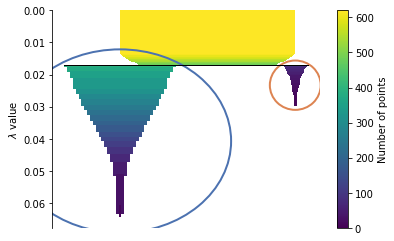

In [ ]:
def hdbsc(x,  param=None):
  from hdbscan import HDBSCAN

  if param != None:
    cluster = HDBSCAN(param)
  else:
    cluster = HDBSCAN(prediction_data=True)
  
  cluster.fit(x)
  print(cluster.labels_.max(), cluster.labels_.min())
  cluster.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette('deep', 8))
  
  return cluster.labels_.astype('str'), cluster.labels_.max()+1, cluster

X=np.concatenate((tfidfs_faked_train, tfidfs_honest_train), axis=0)
clusters_labels, num_labels, clusterer = hdbsc(X)

The graph above shows how the clusters are created. The gamma value indicates the time when each cluster is created, the bigger one is the cluster $0$, the smaller one is the cluster $1$. Let's visualize now how each sample has been classified by the HDBSCAN.

In [ ]:
dff_tr=dff_tr.assign(cluster_HDB = pd.Series(clusters_labels).values)

In [ ]:
fig = px.scatter_3d(dff_tr, x='mean', y='std', z='mode', color='cluster_HDB', symbol='honest')
fig.show()

We can see that all the honests responses belong to the cluster zero, this information can be used to classify as faked all the responses in the test set that do not belong to the cluster zero. The cluster -1 is not actually a cluster, it contains all the samples that are not assigned to the clusters 0 and 1, and it is considered noise by the HDBSCAN algorithm. We can interpret the results in this way: the algorithm found two clusters, that can be seen as to different style of answering, and then all the samples classified as noise do not have any specifical structure. We can imagine that responding honeslty implies to give answers that makes sense, giving to the vector of answers some specifical structure. While the respondee are faking, they are free to answer as they prefer, manipulating the answers of the questions that will make them appear as they want to appear, and answering at somehow at random in all the other questions. The fact that we have a cluster that contains only faked responses means that there is a group of people who lies following some specific strategy. This unsupervised learning technique can be useful to find some hidden structure, especially in high dimensional data that are hard to visualize. The result of this clustering will be exploited later.

#### 5.2 TF-IDF Classification

Since we have seen that mean, max, the mode and the cluster are enough to separate most of the dishonests from the honests, we try the classification using just those 3 features.

In [ ]:
from pycaret.classification import * 
dff_tr_1=dff_tr.drop('std', axis=1)
reg1 = setup(data = dff_tr_1, target = 'honest', preprocess=False) 
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9469,0.9609,0.9721,0.9277,0.9485,0.8936,0.8966,0.261
ridge,Ridge Classifier,0.9423,0.0000,0.9768,0.9161,0.9448,0.8845,0.8882,0.012
lda,Linear Discriminant Analysis,0.9400,0.9637,0.9768,0.9122,0.9426,0.8799,0.8838,0.012
knn,K Neighbors Classifier,0.9399,0.9561,0.9677,0.9184,0.9421,0.8797,0.8818,0.116
ada,Ada Boost Classifier,0.9307,0.9434,0.9630,0.9076,0.9338,0.8612,0.8644,0.090
svm,SVM - Linear Kernel,0.9283,0.0000,0.9407,0.9214,0.9293,0.8566,0.8599,0.011
gbc,Gradient Boosting Classifier,0.9192,0.9628,0.9403,0.9062,0.9216,0.8384,0.8417,0.069
et,Extra Trees Classifier,0.9191,0.9494,0.9446,0.9043,0.9224,0.8378,0.8425,0.413
rf,Random Forest Classifier,0.9146,0.9610,0.9400,0.8985,0.9176,0.8290,0.8324,0.455
nb,Naive Bayes,0.9098,0.9648,1.0000,0.8512,0.9189,0.8191,0.8342,0.013


The results is satisfactory because with just 4 features we are able to classify almost 95% of the dataset correctly, simplifiyng a lot both the train procedure that the prediction phase.

In [ ]:
x=np.concatenate((tfidfs_faked_train, tfidfs_honest_train), axis=0)
data=pd.DataFrame(x, dtype=np.float64)
y=np.concatenate((np.ones(tfidfs_faked_train.shape[0]), np.zeros(tfidfs_honest_train.shape[0])))
data=data.assign(honest=pd.Series(y).values)
from pycaret.classification import * 
reg1 = setup(data = data, target = 'honest', preprocess=False) 
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9630,0.9800,0.9275,1.0000,0.9619,0.9261,0.9293,0.462
rf,Random Forest Classifier,0.9608,0.9786,0.9320,0.9905,0.9599,0.9217,0.9241,0.475
lr,Logistic Regression,0.9607,0.9881,0.9457,0.9776,0.9610,0.9215,0.9228,0.053
ada,Ada Boost Classifier,0.9584,0.9870,0.9500,0.9695,0.9589,0.9168,0.9183,0.388
gbc,Gradient Boosting Classifier,0.9584,0.9896,0.9411,0.9770,0.9581,0.9168,0.9185,0.376
svm,SVM - Linear Kernel,0.9562,0.0000,0.9591,0.9584,0.9578,0.9124,0.9143,0.026
nb,Naive Bayes,0.9423,0.9568,0.9231,0.9649,0.9426,0.8848,0.8873,0.024
knn,K Neighbors Classifier,0.9353,0.9725,0.8735,1.0000,0.9319,0.8709,0.8790,0.127
dt,Decision Tree Classifier,0.9030,0.9026,0.9140,0.8995,0.9063,0.8057,0.8067,0.028
ridge,Ridge Classifier,0.8916,0.0000,0.8202,0.9668,0.8846,0.7841,0.7971,0.022


The we tried to use the full data to see how better the accuracy can get by using the full vector of answers. The improvement is little compared with the increasing in computational cost.

In [ ]:
X=np.concatenate((tfidfs_faked_test, tfidfs_honest_test), axis=0)
X.shape
from hdbscan import approximate_predict
label_test,_ = approximate_predict(clusterer, X)
dff_ts=dff_ts.assign(cluster_HDB = pd.Series(label_test).values)

Now we assign the label related with the clusters that we found with HDBSCAN to the samples in the test set. 

In [ ]:
def hdb_train_test(data_train, data_test):

  hdb_train=data_train[data_train['cluster_HDB']==0]
  hdb_test=data_test[data_test['cluster_HDB']==0]

  data_train['honest_pred'][data_train['cluster_HDB']!=0]=1
  data_test['honest_pred'][data_test['cluster_HDB']!=0]=1

  return hdb_train, hdb_test

def mode_train_test(data_train, data_test):
  mode_train_0=data_train[data_train['mode']==0]
  mode_test_0=data_test[data_test['mode']==0]

  data_train['honest_pred'][data_train['mode']!=0]=1
  data_test['honest_pred'][data_test['mode']!=0]=1

  mode_train_2=data_train[data_train['mode']==2]
  mode_test_2=data_test[data_test['mode']==2]

  data_train['honest_pred'][data_train['mode']!=2]=1
  data_test['honest_pred'][data_test['mode']!=2]=1

  return mode_train_0, mode_test_0, mode_train_2, mode_test_2

def classification(x_train, y_train, x_test, y_test, model=None):
  if model==None:
    prediction = np.ones(x_test.shape[0])
    print(np.where(prediction == y_test, 1, 0).mean())
    return prediction
  else:
    model.fit(x_train, y_train)
    prediction=(x_test)
    print(np.where(prediction == y_test, 1, 0).mean())
    return prediction

We proceed in this way: we classify as faked all the samples in the that do not belong to the cluster 0; then we remove from the remaining dataset, all the sample that do not have the mode 2 or 0, and classify the removed samples as faked. All the samples that are not classified as faked are used in the train set or in the test set to train some classifiers.

In [ ]:
data_train=pd.DataFrame(np.concatenate((tfidfs_faked_train, tfidfs_honest_train), axis=0))
data_test=pd.DataFrame(np.concatenate((tfidfs_faked_test, tfidfs_honest_test), axis=0))

data_train=data_train.assign(cluster_HDB = pd.Series(clusters_labels).values)
data_test=data_test.assign(cluster_HDB = pd.Series(label_test).values)

y=np.concatenate((np.ones(tfidfs_faked_train.shape[0]), np.zeros(tfidfs_honest_train.shape[0])))
data_train=data_train.assign(honest=pd.Series(y).values)

y=np.concatenate((np.ones(tfidfs_faked_test.shape[0]), np.zeros(tfidfs_honest_test.shape[0])))
data_test=data_test.assign(honest=pd.Series(y).values)

y=np.concatenate((np.zeros(tfidfs_faked_train.shape[0]), np.zeros(tfidfs_honest_train.shape[0])))
data_train=data_train.assign(honest_pred=pd.Series(y).values)

y=np.concatenate((np.zeros(tfidfs_faked_test.shape[0]), np.zeros(tfidfs_honest_test.shape[0])))
data_test=data_test.assign(honest_pred=pd.Series(y).values)

data_train=data_train.assign(mode=dff_tr['mode'].values)
data_test=data_test.assign(mode=dff_ts['mode'].values)

data_train=data_test.astype({"cluster_HDB": float, "mode": float})
data_test=data_test.astype({"cluster_HDB": float, "mode": float})

In [ ]:
hdb_train, hdb_test = hdb_train_test(data_train, data_test)
train_0, test_0, train_2, test_2 = mode_train_test(hdb_train, hdb_test)
pred_test_check=data_test['honest_pred'][data_test['honest_pred']==1]
y_test_check=data_test['honest'][data_test['honest_pred']==1]
print(np.where(pred_test_check==y_test_check,1, 0).mean())

0.9882352941176471


We can observe that we have classified correctly more than 98% of the sampled that do not belong to the cluster 0 and don't have the mode equal to 0 or 2.

Now we compare the perfomances of several classification models on the remaining data set.

In [ ]:
from pycaret.classification import * 
train_0_model=train_0.drop(['cluster_HDB', 'honest_pred', 'mode'], axis=1)
train_0_model=train_0_model.astype({i: float for i in range(220)})
train_2_model=train_2.drop(['cluster_HDB', 'honest_pred', 'mode'], axis=1)
train_2_model=train_2_model.astype({i: float for i in range(220)})
test_0_model=test_0.drop(['cluster_HDB', 'honest_pred', 'mode'], axis=1)
test_0_model=test_0_model.astype({i: float for i in range(220)})
test_2_model=test_2.drop(['cluster_HDB', 'honest_pred', 'mode'], axis=1)
test_2_model=test_2_model.astype({i: float for i in range(220)})
train=pd.concat([train_0_model, train_2_model, test_0_model, test_2_model],ignore_index=True)



reg1 = setup(data = train, target = 'honest', preprocess=False) 
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.9699,0.0000,0.8833,0.9417,0.8824,0.8674,0.8845,0.020
rf,Random Forest Classifier,0.9699,0.9423,0.8333,0.9750,0.8690,0.8545,0.8741,0.461
ada,Ada Boost Classifier,0.9699,0.9190,0.8333,0.9750,0.8690,0.8545,0.8741,0.199
et,Extra Trees Classifier,0.9699,0.9679,0.8000,1.0000,0.8633,0.8491,0.8695,0.423
lr,Logistic Regression,0.9640,0.9595,0.8500,0.9333,0.8633,0.8448,0.8605,0.043
gbc,Gradient Boosting Classifier,0.9640,0.9083,0.8333,0.9500,0.8548,0.8366,0.8575,0.178
lda,Linear Discriminant Analysis,0.9522,0.9560,0.7667,0.9333,0.8100,0.7853,0.8079,0.027
ridge,Ridge Classifier,0.9456,0.0000,0.9000,0.8750,0.8524,0.8253,0.8458,0.017
dt,Decision Tree Classifier,0.9026,0.8952,0.8833,0.6683,0.7407,0.6869,0.7100,0.020
knn,K Neighbors Classifier,0.8919,0.8693,0.3167,0.4500,0.3567,0.3391,0.3535,0.120


Given the performances shown above, averaging the best accuracy with the accuracy showed before we can say that with this procedure we get 98% of accuracy over all the dataset.

#### 5.2.3 Detecting faking at single question level

We train several classifiers embeded in a classifier chain that basically use all the answers as features to classify each question as faked or not, taking also into account of the dependency between each answer.

In [ ]:
for model in [KNeighborsClassifier(), AdaBoostClassifier(), SVC(),  RandomForestClassifier(), xgb.XGBClassifier()]:
  m=ClassifierChain(model)
  m.fit(tfidfs_faked_train, true_lies_mask_train)
  p = m.predict(tfidfs_faked_test)
  print(m, np.where(p==true_lies_mask_test, 1, 0).mean())

ClassifierChain(base_estimator=KNeighborsClassifier(algorithm='auto',
                                                    leaf_size=30,
                                                    metric='minkowski',
                                                    metric_params=None,
                                                    n_jobs=None, n_neighbors=5,
                                                    p=2, weights='uniform'),
                cv=None, order=None, random_state=None) 0.7811942959001783
ClassifierChain(base_estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                                  base_estimator=None,
                                                  learning_rate=1.0,
                                                  n_estimators=50,
                                                  random_state=None),
                cv=None, order=None, random_state=None) 0.7909536541889483
ClassifierChain(base_estimator=SVC(C=1.0, break_ties=False, cache

Now we print for the test set, the distribution of the classification

In [ ]:
i_s=[]
for i in [0.6, 0.7, 0.8, 0.9, 0.95]:
  index=np.argwhere(np.where(p==true_lies_mask_test, 1, 0).mean(axis=1)<i).reshape(-1)
  i_s.append(index)
  print('index shape ', index.shape)
  X=tfidfs_faked_test[index]
  print('below accuracy threshold  ', X.shape[0]/tfidfs_faked_test.shape[0]*100,'%')
  from hdbscan import approximate_predict
  label_test,_ = approximate_predict(clusterer, X)
  unique, count = np.unique(label_test, return_counts=True)
  print(i,' clusters: ', unique, 'count: ', count)

index shape  (6,)
below accuracy threshold   5.88235294117647 %
0.6  clusters:  [-1  0] count:  [1 5]
index shape  (9,)
below accuracy threshold   8.823529411764707 %
0.7  clusters:  [-1  0] count:  [2 7]
index shape  (35,)
below accuracy threshold   34.31372549019608 %
0.8  clusters:  [-1  0  1] count:  [17 15  3]
index shape  (86,)
below accuracy threshold   84.31372549019608 %
0.9  clusters:  [-1  0  1] count:  [52 18 16]
index shape  (97,)
below accuracy threshold   95.09803921568627 %
0.95  clusters:  [-1  0  1] count:  [59 18 20]


We can observe how much samples of the test set get the single questions classified uncorrectly. The most mistaken belong to the cluster 0, that is the cluster that contains also the honest responses, and to the cluster -1, that is not an actual cluster but it is considered as noise from the HDBSCAN. That's understandable because the the faked answers that belongs to the cluster 0 are more similar to the honest answers and so it's harder to spot them. The "noisy" samples can have some strange structure that makes hard for the classifiers to spot the faked answers.

## 6. Questionnaire reconstruction
The goal this time is to completely reconstruct the honest answers given by a subject to the personality questionnaire, starting from the falsified one. Before presenting the methods used for this purpose, it is useful to analyze the dataset from the perspective of reconstruction. We therefore try to understand the behavior of patients in answering the questionnaire by following the two strategies (honest vs dishonest approach).

#### 6.1 Dataset Creation
The first step consists in organizing the dataset: we select for the reconstruction the honest and dishonest patients together with the $220$ questions' scores, which go from a minimum of $0$ to a maximum of $3$.

To each sample, a alphabetic label is accompained **H** for true answers and **D** for faked. In order to simplify the managing of coding information we have assigned to each patient a numerical target: $0$ for honests and $1$ for the dishonest.

We already know that the pairs of questionnaires associated with a specific patient have been provided to us in the correct order, so to keep track of these matches we have accompanied each sample with an identification code **idx** from $0$ to $411$. 

In [10]:
# data loading (discard the clinical patients)
data = pd.read_csv('PID5_df.csv', encoding = 'utf-8', sep = ';')
data = data[data.CONDITION != 'P']
print("Complete  dataset's shape: {}".format(np.shape(data)))
print("Honest    dataset's shape: {}".format(np.shape(data[data.CONDITION == 'H'])))
print("Dishonest dataset's shape: {}".format(np.shape(data[data.CONDITION == 'D'])))

# assign a numerical target: 
# 0 - honests 
# 1 - dishonests
# create a dictionary and a list with targets for condition
condition_to_target = {'H': 0, 'D': 1}
targets = list(condition_to_target.values())

# create a function to convert each categorical label into a numerical one
ToTarget = lambda x : condition_to_target[x]

# adding a new column with the targets 
data['target'] = data['CONDITION'].apply(ToTarget).astype('int')

# add a column with identification indeces
data['idx'] = [i for i in range(0,412)] * 2
data.tail()

Complete  dataset's shape: (824, 221)
Honest    dataset's shape: (412, 221)
Dishonest dataset's shape: (412, 221)


,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34,Q35,Q36,Q37,Q38,Q39,Q40,...,Q184,Q185,Q186,Q187,Q188,Q189,Q190,Q191,Q192,Q193,Q194,Q195,Q196,Q197,Q198,Q199,Q200,Q201,Q202,Q203,Q204,Q205,Q206,Q207,Q208,Q209,Q210,Q211,Q212,Q213,Q214,Q215,Q216,Q217,Q218,Q219,Q220,CONDITION,target,idx
819,2,0,0,3,3,2,2,1,2,3,2,3,0,2,2,3,3,3,3,3,2,3,2,3,3,2,1,2,2,1,2,2,3,2,2,3,3,2,2,3,...,2,1,0,0,3,1,3,3,3,1,2,2,3,3,1,2,3,0,0,0,1,1,2,1,1,2,1,2,1,1,3,2,1,2,1,1,1,D,1,407
820,2,3,2,3,3,1,0,1,3,0,3,1,0,2,0,0,3,3,2,3,2,3,1,3,3,3,3,2,3,3,2,0,3,0,3,3,3,2,0,0,...,3,3,0,3,3,0,3,2,3,3,2,0,3,3,3,1,3,3,0,0,3,3,1,3,1,3,3,2,1,3,2,2,3,3,2,0,0,D,1,408
821,3,0,1,0,0,1,3,0,2,3,3,2,0,1,1,0,0,3,3,3,3,3,3,0,0,3,3,3,3,2,1,3,3,1,0,3,3,3,3,3,...,3,1,0,3,0,0,0,0,3,3,3,3,3,3,3,2,3,3,0,3,0,3,3,3,2,3,2,0,0,3,0,0,3,3,3,3,0,D,1,409
822,3,3,2,3,3,3,3,3,1,3,3,3,0,2,1,3,3,3,3,3,3,3,3,3,3,1,2,3,2,2,3,1,3,1,3,3,3,3,3,3,...,3,3,2,3,3,1,3,2,3,3,3,3,3,3,3,0,3,2,0,0,3,3,3,3,2,3,0,3,1,3,3,3,3,3,3,3,3,D,1,410
823,3,3,3,3,3,3,3,3,3,3,3,0,3,2,3,3,3,3,3,3,3,3,3,3,3,0,3,3,3,1,2,3,3,2,3,3,3,3,3,3,...,2,3,1,3,3,2,3,2,3,2,3,2,3,3,3,2,3,3,0,0,3,3,3,3,3,3,1,3,0,3,3,0,3,3,3,3,3,D,1,411


Before starting with the explanations of the various reconstructing models, it is useful to provide some information about data behaviour and distribution thus making a clear comparison between honests and dishonests attitude in answering to the questions. 

For this reason, let us extract two subsets from the dataframe and store them into arrays. 

In [ ]:
honest    = np.array(data[data.CONDITION == 'H'].iloc[:, :220])
dishonest = np.array(data[data.CONDITION == 'D'].iloc[:, :220])

In [6]:
def plot_average_questions(I1, I2, I3 = np.array([]), diff = [13]):
    '''
    This is useful function for graphic display which takes as input two arrays (by default) of 
    questions' scores and returns a plot comparing the overall answers for each question.
    
    
    NOTE: typically the first and the second correspond to true and false answers' arrays. 
    '''
    # set the numbers of plots
    num_fig = 5
    
    # set the numbers of questions to be visualized in a plot 
    num_qst = 44
    
    # some settings 
    fig, axes = plt.subplots(num_fig, figsize = (20,20))
    
    # two inputs are passed 
    if I3.shape[0] != I2.shape[0]: 
        # set colors 
        colors = ['green', 'red', 'lightcyan']
        
        # average scores over all the subjects
        means_per_question = pd.DataFrame({0: np.mean(I1, axis=0), 1: np.mean(I2, axis=0)}).T
        means_per_question.columns = ['Q{}'.format(qst) for qst in range(1, 221)]

        # plot all the curves for each class
        mean0 = means_per_question.loc[0]
        mean1 = means_per_question.loc[1]
        x = np.arange(0, 44, 1)
        for idx in range(0,5):
            # first input
            axes[idx].plot(mean0[idx*num_qst:(idx+1)*num_qst], '--.', color = colors[0])

            # second input
            axes[idx].plot(mean1[idx*num_qst:(idx+1)*num_qst], '--.', color = colors[1])
            
            # color the intermediate region
            if diff != False:
                axes[idx].fill_between(x, mean0[idx*num_qst:(idx+1)*num_qst], mean1[idx*num_qst:(idx+1)*num_qst], 
                                       color = colors[2])

            # set grid 
            axes[idx].grid(color = 'gray', linestyle = '--', linewidth = 0.5)
            plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation = 45)
        
    
    # three inputs are passed
    else: 
        # set colors 
        # for colored area: only the interaction between first and third arrays
        if 12 not in diff: 
            colors = ['green', 'red', 'cyan', 'lemonchiffon']
        
        # for colored area: also the interaction between first and second arrays
        else: 
            colors = ['green', 'sandybrown', 'deepskyblue', 'peachpuff', 'lightblue']
            
        # average scores over all the subjects and store in a dictionary 
        means_per_question = pd.DataFrame({0: np.mean(I1,axis=0), 1: np.mean(I2,axis=0), 2: np.mean(I3,axis=0)}).T
        means_per_question.columns = ['Q{}'.format(qst) for qst in range(1, 221)]

        # plot all the curves for each input
        mean0 = means_per_question.loc[0]
        mean1 = means_per_question.loc[1]
        mean2 = means_per_question.loc[2]
        
        x = np.arange(0, num_qst, 1)
        for idx in range(0,num_fig):
            # first input
            axes[idx].plot(mean0[idx*num_qst:(idx+1)*num_qst], '--.', color = colors[0])

            # second input
            axes[idx].plot(mean1[idx*num_qst:(idx+1)*num_qst], '--.', color = colors[1])
            
            # third input 
            axes[idx].plot(mean2[idx*num_qst:(idx+1)*num_qst], '--.', color = colors[2])
            
            # color the intermediate region
            # only interaction between first and third arrays
            if 12 not in diff:
                axes[idx].fill_between(x, mean0[idx*num_qst:(idx+1)*num_qst], 
                                       mean2[idx*num_qst:(idx+1)*num_qst], color = colors[3], alpha = 0.4)
            
            # also interaction between first and second arrays
            else:
                # between first and second
                axes[idx].fill_between(x, mean0[idx*num_qst:(idx+1)*num_qst],
                                       mean1[idx*num_qst:(idx+1)*num_qst], color = colors[3], alpha = 0.5)
                # between first and third 
                axes[idx].fill_between(x, mean0[idx*num_qst:(idx+1)*num_qst], 
                                       mean2[idx*num_qst:(idx+1)*num_qst], color = colors[4], alpha = 0.4)
                
            # add grid 
            axes[idx].grid(color = 'gray', linestyle = '--', linewidth = 0.5)
            
            # rotate x-ticks
            plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation = 45)        

    # set title 
    axes[0].set_title('Mean scores wrt each question')
    plt.show()

    return

The graph immediately below shows the average scores for each question, where the means have been calculated on the groups of patients: in green the honests, in red the dishonests. 

To give a clearer reference, if we start as in this case from two $412\times220$ matrices, each curve corresponds to a vector of $220$ whose coordinates are given by the averages performed on the scores of each row given a column (which here corresponds to a question). 

The light blue area allows us to better visualize the gap for each question between the average scores given following the two complementary strategies. We note that in most cases the two groups answered very differently: the false scores tend to overestimate the true ones. There are exceptions, such as questions 35, 86, 87, 95, 96 or 111, where the two average behaviors are similar and in rare cases honest responses are underestimated. 

In general, however, we can say that there is a certain tendency to increase scores in falsifying the questionnaire, an aspect that could also depend on the real personality of the participants.

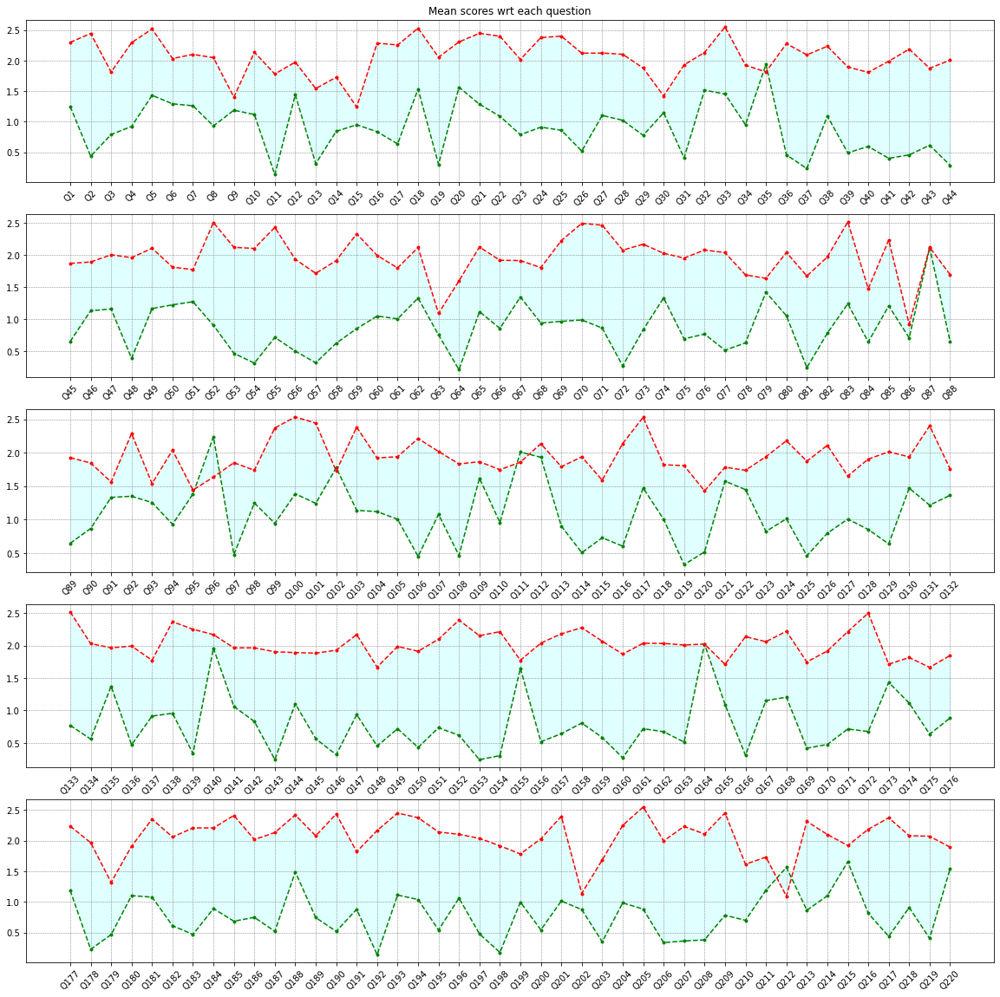

In [ ]:
plot_average_questions(honest, dishonest)

If the previous graph highlights the average behavior of the participants for each question as a group of honest and dishonest people, in this second case we want to study the approach of a single individual. We, therefore, calculated the means of the scores given to all the questions in the two modes and then compared in the following plots. 

Also this time we note that in most cases the single person tends to increase, on average, the scores of the questionnaire even if this is not always true. 

*Note*: just to have a better visualization, in the first graph are considered the first half of patients and in the second one the remainings. 

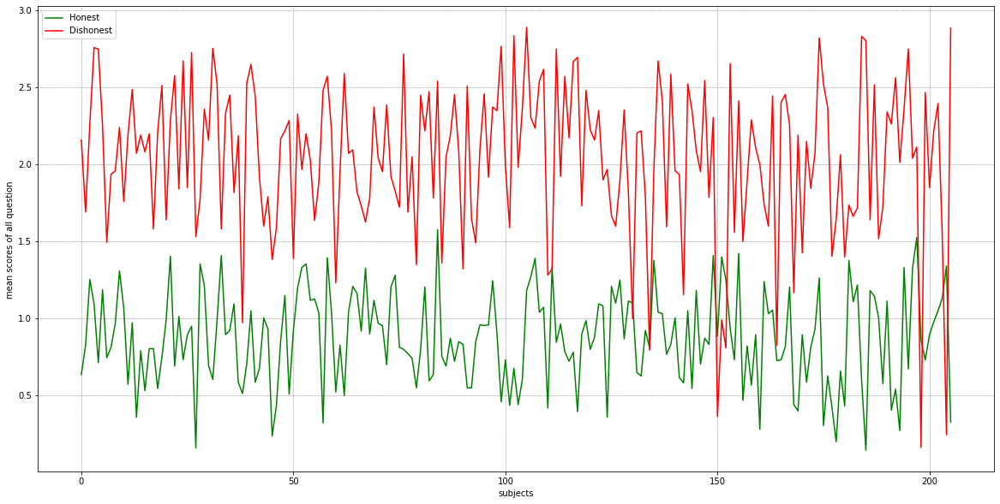

In [ ]:
# means for each subject over all the questions considering the various kind of patients
# first 206 patients
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(np.mean(honest[:206], axis = 1), color = 'green')
plt.plot(np.mean(dishonest[:206], axis = 1), color = 'red')
plt.legend(['Honest', 'Dishonest'])
plt.ylabel('mean scores of all question ')
plt.xlabel('subjects')
plt.grid(color = 'gray', linestyle = '--', linewidth = 0.5)
plt.show()

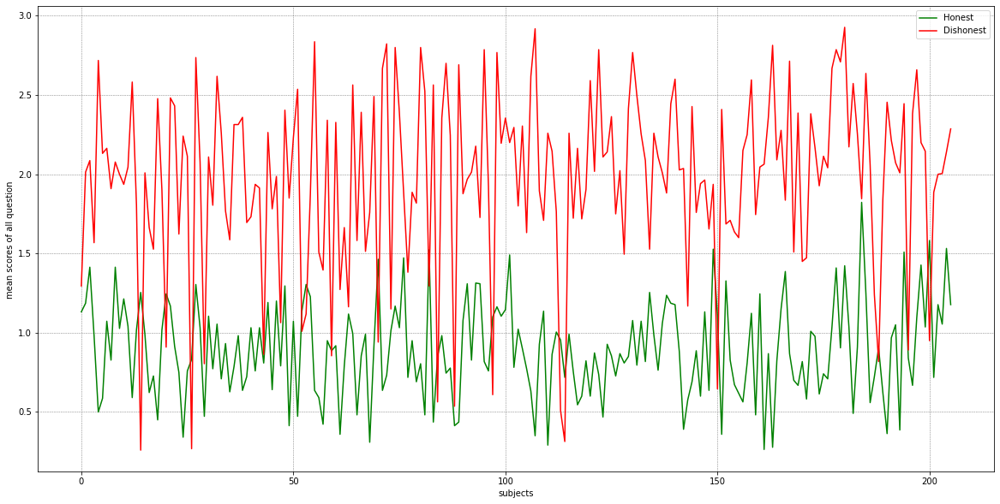

In [ ]:
# means for each subject over all the questions considering the various kind of patients
# last 206 patients
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(np.mean(honest[206:], axis = 1), color = 'green')
plt.plot(np.mean(dishonest[206:], axis = 1), color = 'red')
plt.legend(['Honest', 'Dishonest'])
plt.ylabel('mean scores of all question ')
plt.xlabel('subjects')
plt.grid(color = 'gray', linestyle = '--', linewidth = 0.5)
plt.show()

**Note:** for each method considered in the following sections, the dataset has been suitably adapted to the programming needs. In each section it will be explained what type of data were used and what division into training and testing set.

#### 6.2 Naive Approach Training & Evaluation

To build the first reconstruction model we have based on qualitative observations, such as those inferred from the observation of the previous graphs. We therefore assumed that the people subjected to the experiment had adopted the less or more the same falsification strategies in the various questions. 

The procedure followed in this case is quite simple and is based on the difference between the scores given dishonestly and honestly. We start considering the two matrices $d$ and $h$, each consisting of $N_{tr}$ lines (number of subjects in the training set) and $Q$ columns (number of questions). 

To obtain the *reconstruction matrix* $D$, we performed an element-by-element subtraction between the scores given in the two modes, respecting the order and correspondence in the answers:

\begin{equation}
D_{s, q} = d_{s, q} - h_{s, q} \qquad \forall s \in \{1, 2, ... N_{tr}\} \quad\text{and}\quad \forall q \in \{1, 2, ..., 220\} 
\end{equation}

Since the goal is to predict correct answers given a falsified questionnaire, the information contained in the matrix must be compressed into a single *reconstruction vector* $\bar{D}$ of $220$ components. To do this we performed an average of the columns of the matrix $D$:

\begin{equation}
\bar{D}_q = \frac{1}{N_{tr}} \sum_{s = 1}^{N_{tr}} D_{s, q} \qquad \implies \qquad h^*_{p, q} = f(d_{p, q} - \bar{D}_q) \qquad \forall p \in \{1, 2, ..., N_{ts}\}
\end{equation}

The honest questionnaire (which is mathematically represented as a vector) is obtained subtracting the faked scores by the corresponding elements of the reconstruction vector. The result thus obtained, however, is not definitive as the scores must be converted into an integer value in the interval of possible results $[0, 3]$. This means applying a *link* or *converter function* $f$ to the differences, establishing threshold values that divide the range of continuous values into four parts:

\begin{equation}
f : \mathbb{R} \longrightarrow \{0, 1, 2, 3\}
\end{equation}

Obviously, to reconstruct a matrix, it is sufficient to subtract the reconstruction vector from each row (corresponding to the responses of a single patient) and subsequently convert the differences into integer values.


The most immediate choice for the conversion function is to start from the python-implemented *round* function, which rounds a decimal number to the nearest integer. This is equivalent to choosing $\{0.5, 1.5, 2.5\}$ as intermediate threshold values. To manage the extreme cases (very rare), e.g. the reconstructions which go below $-1$ and above $4$, we have applied corrections in such a way as to return only values within the given range of scores.
Surely this choice has pros and cons: all negative values are converted as a null score while all those differences that exceed $3$ (although rare) are projected in the last class. This is equivalent to saying that the transformation intervals do not have the same amplitude but this is not a problem when most of the differences stay in the given interval.

In [3]:
def converter(pred):
    '''
    This function converts the continuous predictions in the final scores
    ''' 
    # convert to the near integer
    prediction = (np.round(pred, 0)).astype(int)
    
    # project in the interval [0,3] 
    to_zero_tree = lambda x: np.array([int(min(max(element,0),3)) for element in x])
    for pred in range(0, np.shape(prediction)[0]):
        prediction[pred] = to_zero_tree(prediction[pred])
    
    return prediction

Let us make a final premise, before moving on to creating the model on our data, by presenting the metrics used to evaluate the goodness of the predictions.

The _overall_accuracy_ function takes as input two multidimentional arrays (where $T \sim n \times Q$ contains the true values for items' score and the other $P \sim n \times Q$ gives the relative predictions where $n$ is the number of samples in the considered dataset) and returns an average accuracy $A$. It is calculated starting from the common definition of accuracy and considering each couple of single vectors as follows: 

\begin{equation}
A = \frac{1}{n}\sum_{i = 1}^n a_i = \frac{1}{n}\sum_{i = 1}^n accuracy\_score(t_i, p_i)
\end{equation}
where
- $accuracy\_score$ is a scikitlearn's predefined function which calculates the accuracy between two arrays; 
- $t \in T$ is a single vector made up of $Q$ true values as coordinates; 
- $p \in P$ is a single vector made up of $Q$ predicted values which has to match with the true one;
- $Q$ is the number of considered questions (without PCA it starts from $220$). 

In [4]:
def overall_accuracy(true, pred):
    '''
    This function returns the overall accuracy for predictions 
    '''
    acc = np.mean([accuracy_score(true[pnt], pred[pnt]) for pnt in range(0, np.shape(true)[0])])
    
    return np.round(acc, 4)

In the case of the reconstruction of the honest questionnaire starting from the answers given in a dishonest way, the accuracy (both on the single pair and on the entire dataset) can be a slightly inadequate or incomplete metric. In fact, suppose that the true value of the subject $i$ for an answer $j \in \{0, 1, ..., 219\}$ is $t_{i, j} = 1$. A prediction $p_{i, j}^{ (1)} = 0$ is more auspicable than $p_{i, j}^{ (2)} = 2$, for instance, being nearest to the true value but this subtlety is not taken into account by the function that calculates the accuracy since, by definition, it is concerned only with the results that have been perfectly returned. For this reason, it is useful defining a new metric that evaluates the distance between true and reconstructed value and then quantifies in some way how much precise the prediction is: 

\begin{equation}
D = \frac{100}{D_{max}} \sum_{i = 1}^{n} \lvert t_{i} - p_{i} \rvert 
\end{equation}
where 
- the difference is executed "element by element" (remember that $t_i$ and $p_i$ are row vectors of $Q$ coordinates);
- $D_{max}$ is the maximum obtainable deviation between honest response and predicted one, scilicet if item's possible score varies discretely within the range $[0, 3]$ we imagine that the worst situation is that one in which all the true responses are $0$ and the reconstructor returns only $3$. Now it is easy to guess that maximum difference is defined as $3\cdot n \cdot Q$; 
- multiplying the ratio by $100$ we can obtain a percentage estimate. 

*Note*: the less is the deviance, the better are the results.

In [5]:
def deviation(true, pred, mean = True): 
    '''
    This function returns the total percentage deviation between the true and predicted values 
    '''
    dev = np.sum(np.abs(true - pred))
    
    if mean == True:
        max_dev = 3*np.shape(true)[0]*np.shape(true)[1]
        
        return np.round(dev*100/max_dev, 2)
    
    else: 
        return dev

Since the method looks quite basic, we decided to build a model for five divisions of the dataset into training and test sets, with random patient extractions. In this way it is possible to ascertain the consistency of the method and verify that the goodness of the predictions did not depend on the particular selection of the data. 

For each *cv* iteration, $N_{ts}=70$ subjects are selected for the test while the rest make up the training set ($N_{tr}=342$). 

For each of these combinations, the reconstructions are estimated and the overall accuracy, deviation with and without converter are evaluated.

In [ ]:
# library for random sampling
import random 

# create the list for the indeces
indexes = [idx for idx in range(0,412)]

# shuffle randomly the indeces 
random.Random(10).shuffle(indexes)

# create lists to store information
reconstructions = []
predictions = []
metrics = {'accuracy':[], 'deviance_no_conv':[], 'deviance':[], 'mse':[]}

for cv in range(0, 5):
    
    # consider the train and test indexes
    idxtest  = indexes[cv*70:(cv+1)*70]
    idxtrain = [idx for idx in indexes if idx not in idxtest]
    #print('\n', np.shape(idxtest))
    #print(np.shape(idxtrain))
    
    # create the train and test sets 
    diffxdtrain = np.array(data[data.target == 1].iloc[idxtrain, :220])
    diffxdtest  = np.array(data[data.target == 1].iloc[idxtest,  :220])

    diffxhtrain = np.array(data[data.target == 0].iloc[idxtrain, :220])
    diffxhtest  = np.array(data[data.target == 0].iloc[idxtest,  :220])
    
    
    # differences  between faked and true response for each pair of question 
    diff = diffxdtrain - diffxhtrain
    # average for each question over all the patient
    avg_diff = np.mean(diff, axis = 0)


    # reconstruct the honest responses subtracting to faked one the average differences
    reco_test = diffxdtest - avg_diff
    pred_test = converter(diffxdtest - avg_diff)


    # metrics
    print('MODEL {}'.format(cv+1))
    print('Overall accuracy:           {}% '.format(np.round(100*overall_accuracy(diffxhtest, pred_test), 2)))
    print('Deviation (no converter):   {}% '.format(np.round(deviation(diffxhtest, reco_test), 2)))
    print('Deviation (with converter): {}% '.format(np.round(deviation(diffxhtest, pred_test), 2)))
    print('Mean squares Err:           {}\n'.format(np.round(mean_squared_error(diffxhtest, pred_test), 2)))
    
    reconstructions.append(reco_test)
    predictions.append(pred_test)
    metrics['accuracy'].append(np.round(100*overall_accuracy(diffxhtest, pred_test), 2))
    metrics['deviance_no_conv'].append(np.round(deviation(diffxhtest, reco_test), 2))
    metrics['deviance'].append(np.round(deviation(diffxhtest, pred_test), 2))
    metrics['mse'].append(np.round(mean_squared_error(diffxhtest, pred_test), 2))
    
print('\n', 'Overall results')
print('Mean accuracy:  {}'.format(np.round(np.mean(metrics['accuracy'])),2))
print('Mean deviation: {}'.format(np.round(np.mean(metrics['deviance'])),2))

MODEL 1
Overall accuracy:           31.82% 
Deviation (no converter):   37.97% 
Deviation (with converter): 31.59% 
Mean squares Err:           1.52

MODEL 2
Overall accuracy:           33.77% 
Deviation (no converter):   38.55% 
Deviation (with converter): 30.5% 
Mean squares Err:           1.47

MODEL 3
Overall accuracy:           34.12% 
Deviation (no converter):   38.17% 
Deviation (with converter): 30.29% 
Mean squares Err:           1.46

MODEL 4
Overall accuracy:           34.9% 
Deviation (no converter):   40.89% 
Deviation (with converter): 30.56% 
Mean squares Err:           1.52

MODEL 5
Overall accuracy:           32.06% 
Deviation (no converter):   39.7% 
Deviation (with converter): 32.54% 
Mean squares Err:           1.63


 Overall results
Mean accuracy:  33.0
Mean deviation: 31.0


The five reconstructions returned results with minimal variations, so we can conclude that the naive approach does not depend on the particular subdivision of the dataset. The final mean accuracy is 33% and mean deviation is 31%. 

The figure below shows the comparison between an example of reconstruction on the test set (in light blue) and the relative scores given on the questionnaire. The model considered is that relating to the last subdivision.

The representation principle is the same as the previous one, but now in the following graph the data of the test set are compared with the predictions: we note that on average the differences between the honest responses and the reconstructions (yellow area) are minor but not perfect. Also remember that this is a purely qualitative view as the results are averaged across all patients in the test set.

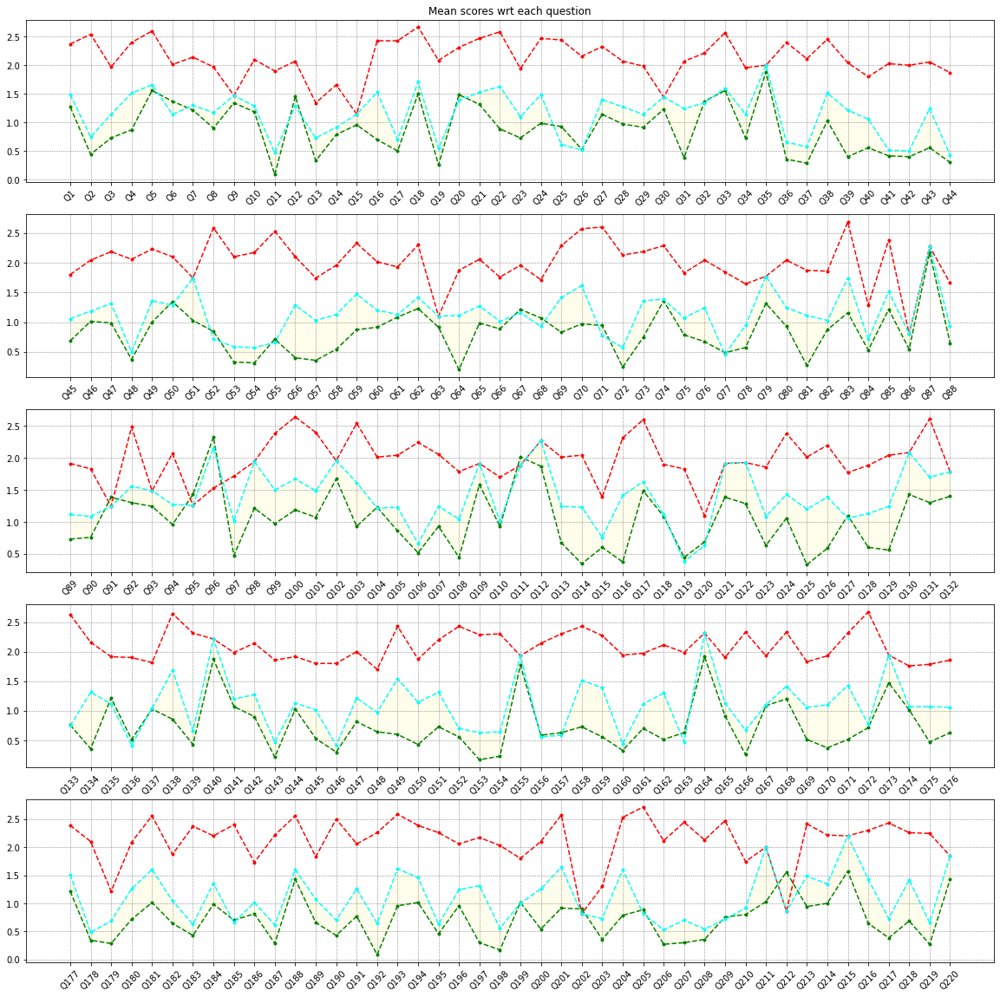

In [ ]:
# plot honest, dishonest and predictions on test set (model 5)
plot_average_questions(diffxhtest, diffxdtest, predictions[4])

## 6.3 Denoising Auto-encoder Training & Evaluation

An *autoencoder* (AE) is a type of artificial neural network used to deal with many task from facial recognition to anomaly detection. It presents two main parts: an *encoder* that maps the input into the code, and a *decoder* that maps the code to a reconstruction of the input. One of the most common applications is to remove noise from pixel-defined images. This principle can also be used in more general reconstruction situations. 

In our case, the input of the encoder is given by the faked scores, while the output of the decoder returns the reconstructed questionnaires, which during the training phase of the model are given by the honest scores.

For this method of reconstruction we have focus our attention on two main aspects: 
- the **structure of neural network** performing a tuning parameter procedure to find the best combinations of encoding dimension and activation functions;
- the **type of conversion** of continuous output into a final reconstruction of questionnaire. 

Let us focus for a while on the second one. As seen in the previous model, it is necessary to convert the regression result to one of four possible numerical classes and to do this there are several choices of threshold values. We have considered two conversion modes: the first is the one *converter function* described in the section on the Naive model, the second *converter normalized function* maps the normalized values in the interval $[0,1]$ into final values in the right range. 
Indeed, for this second model we decided - after several attempts - to normalize the scores of the entire dataset in that unit interval. Anyway for the latter conversion mode, four small intervals of equal amplitude are obtained, which corresponds to selecting as threshold $\{0.75, 1.5, 2.25\}$. The goodness of the predictions obviously depends on the choice of the type of conversion but even before on the distribution of the data in the various classes. There is also a strong link with the choice of AE activation functions since the definition of which influences the domain of output values.

In [7]:
def converter_normalized(pred_normalized):
    '''
    TO APPLY ON NORMALIZED PREDICTION (i.e. before the multiplication by n)
    This function divides the [0, 1] range into four equispaced intervalts 
    (thus making each score prediction equiprobable) and returns the final 
    unnormalized predictions 
    '''    
    pred = pred_normalized.copy()
    pred = pd.DataFrame(pred, columns = ['Q{}'.format(i) for i in range(0, np.shape(pred)[1])])
    T = [0.25, 0.5, 0.75]
    
    for qst in range(0, np.shape(pred)[1]):
        pred.loc[pred['Q{}'.format(qst)] >= T[2],'Q{}'.format(qst)] = 3
        pred.loc[(pred['Q{}'.format(qst)] >= T[1]) & (pred['Q{}'.format(qst)] < T[2]), 'Q{}'.format(qst)] = 2
        pred.loc[(pred['Q{}'.format(qst)] >= T[0]) & (pred['Q{}'.format(qst)] < T[1]), 'Q{}'.format(qst)] = 1
        pred.loc[pred['Q{}'.format(qst)] < T[0], 'Q{}'.format(qst)] = 0

    pred = (np.array(pred)).astype(int)
    
    return pred

The preparation of the dataset is as follows: through a hold-out technique we divided the data into training, validation and test set following the proportion 70:15:15. Each score was normalized across the range. 

In [8]:
!pip install fast_ml

     |████████████████████████████████| 42 kB 700 kB/s 


In [11]:
from fast_ml.model_development import train_valid_test_split

# define n for normalize scores in range [0, 1] and number of considered items 
n = 3
qst_number   = 220
np.random.seed(10)

# split indexes into train, valid and test 
xdtrain, idxtrain, xdvalid, idxvalid, xdtest, idxtest = train_valid_test_split(data[data.target==1], target = 'idx', train_size = 0.7, valid_size = 0.15, test_size = 0.15)

# dishonest train, validation and test (with normalization)
xdtrain = np.array(data[data.target == 1].iloc[idxtrain, :220])/n
xdvalid = np.array(data[data.target == 1].iloc[idxvalid, :220])/n
xdtest  = np.array(data[data.target == 1].iloc[idxtest,  :220])/n

print('Dishonest train features: {}'.format(np.shape(xdtrain)))
print('Dishonest valid features: {}'.format(np.shape(xdvalid)))
print('Dishonest test features:  {}\n'.format(np.shape(xdtest)))


# honest train, valid and test (with normalization)
xhtrain = np.array(data[data.target == 0].iloc[idxtrain, :220])/n
xhvalid = np.array(data[data.target == 0].iloc[idxvalid, :220])/n
xhtest  = np.array(data[data.target == 0].iloc[idxtest,  :220])/n

print('Honest train features:    {}'.format(np.shape(xhtrain)))
print('Honest valid features:    {}'.format(np.shape(xhvalid)))
print('Honest test features:     {}'.format(np.shape(xhtest)))

Dishonest train features: (288, 220)
Dishonest valid features: (62, 220)
Dishonest test features:  (62, 220)

Honest train features:    (288, 220)
Honest valid features:    (62, 220)
Honest test features:     (62, 220)


Before proceeding with the tuning procedure, it is interesting to study the distribution of data in the classes.

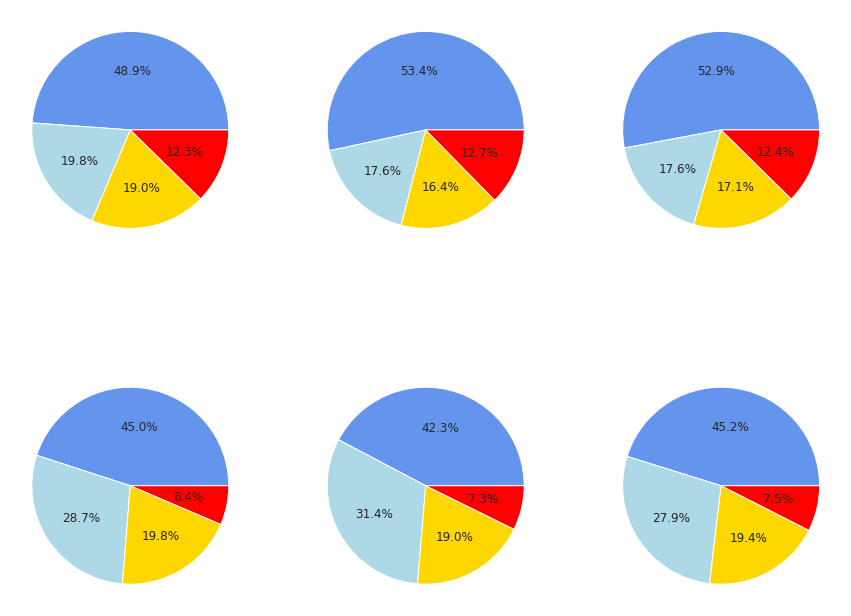

In [12]:
# Pie charts for train, validation and test set (dishonests and honests) 
# Plot preparing
clrs = ['cornflowerblue', 'lightblue', 'gold', 'red']
fig, axes = plt.subplots(2, 3, figsize = (15,12))
sns.set()

dfdtrain  = pd.DataFrame({'scores' : np.reshape(xdtrain*n, (np.shape(xdtrain)[0]*np.shape(xdtrain)[1]))})
dfdvalid  = pd.DataFrame({'scores' : np.reshape(xdvalid*n, (np.shape(xdvalid)[0]*np.shape(xdvalid)[1]))})
dfdtest   = pd.DataFrame({'scores' : np.reshape(xdtest*n,  (np.shape(xdtest)[0]*np.shape(xdtest)[1]))})

dfhtrain  = pd.DataFrame({'scores' : np.reshape(xhtrain*n, (np.shape(xhtrain)[0]*np.shape(xhtrain)[1]))})
dfhvalid  = pd.DataFrame({'scores' : np.reshape(xhvalid*n, (np.shape(xhvalid)[0]*np.shape(xhvalid)[1]))})
dfhtest   = pd.DataFrame({'scores' : np.reshape(xhtest*n,  (np.shape(xhtest)[0]*np.shape(xhtest)[1]))})

# pie chart for dishonests
axes[0,0].pie(dfdtrain['scores'].value_counts(sort = True), autopct = '%1.1f%%', colors = clrs)
axes[0,1].pie(dfdvalid['scores'].value_counts(sort = True), autopct = '%1.1f%%', colors = clrs)
axes[0,2].pie(dfdtest['scores'].value_counts(sort = True),  autopct = '%1.1f%%', colors = clrs)

# pie chart for honests
axes[1,0].pie(dfhtrain['scores'].value_counts(sort = True), autopct = '%1.1f%%', colors = clrs)
axes[1,1].pie(dfhvalid['scores'].value_counts(sort = True), autopct = '%1.1f%%', colors = clrs)
axes[1,2].pie(dfhtest['scores'].value_counts(sort = True),  autopct = '%1.1f%%', colors = clrs)

#axes[2].set_title('Frequency pie chart of Predicted set \n (with round converter)', fontsize = 15)

plt.show()

The analysis on the best parameters was done by fixing the number of layers but considering different combinations of activation functions and encoding dimension for the input. In total $m = 4*4*16 = 312$ combinations were rated considering as metrics the overall accuracy, deviation (without and with the convertes) and the mse. 

In [ ]:
# parameter tuning 
AF = ['relu', 'elu', 'tanh', 'sigmoid']
ED = [200, 190, 180, 170, 160, 150, 140, 130, 120, 110, 100, 90, 80, 70, 60, 50]

# create a 2d array to store the information of all the models (all combination of parameters) 
parameters  = [] #af1, af2 and enc_dim

store_hist  = [] #history (train-valid)
store_score = [] #scores on test set 

store_out   = [] #output in [0,1]
store_out3  = [] #output in [0,3]

store_conv  = [] #prediction (round)
store_convn = [] #prediction (normalized)

store_acc   = [] #accuracy (round)
store_accn  = [] #accuracy (normalized)

store_dev0  = [] #deviation (no conversion)
store_dev   = [] #deviation (round)
store_devn  = [] #deviation (normalized)

store_mse   = [] #store mse on test 


# models creation 
for af1 in AF:
    for af2 in AF:
        
        # create empty lists to store the information related to a single iteration (e.g. combination)
        af1_af2_encdim = [] #af1,af2,enc_dim

        af1_af2_hist   = [] #history
        af1_af2_score  = [] #scores on test set 

        af1_af2_out    = [] #output in [0,1]
        af1_af2_out3   = [] #output in [0,3]
 
        af1_af2_conv   = [] #prediction (round)
        af1_af2_convn  = [] #prediction (normalized)

        af1_af2_acc    = [] #accuracy (round)
        af1_af2_accn   = [] #accuracy (normalized)

        af1_af2_dev0   = [] #deviation (no conversion)
        af1_af2_dev    = [] #deviation (round)
        af1_af2_devn   = [] #deviation (normalized)
        
        af1_af2_mse    = [] # mse
        
        
        for enc_dim in ED:
            
            af1_af2_encdim.append('{}-{}-{}'.format(af1, af2, enc_dim))
            
            # encoder 
            input_qst = tf.keras.layers.Input(shape = (qst_number,))

            encoded = tf.keras.layers.Dense(enc_dim, activation = af1)(input_qst)
            
            # decoder
            decoded = tf.keras.layers.Dense(qst_number, activation = af2)(encoded)

            # final autoencoder
            autoencoder = tf.keras.models.Model(input_qst, decoded)

            autoencoder.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.01), loss = 'mse')
            
            
            history = autoencoder.fit(xdtrain, xhtrain, epochs = 30, batch_size = 512, verbose = 0,
                                      validation_data = (xdvalid, xhvalid))
            
            print('\n', 'Modello {}-{}-{}:'.format(af1, af2, enc_dim))
            scores = autoencoder.evaluate(xdtest, xhtest, verbose = 2)
            
            AE_prediction = autoencoder.predict(xdtest)
            
            # store the useful information 
            af1_af2_hist.append(history)
            af1_af2_score.append(scores)
            
            af1_af2_out.append(AE_prediction)
            af1_af2_out3.append(AE_prediction*n)
            
            af1_af2_conv.append(converter(AE_prediction*n))
            af1_af2_convn.append(converter_normalized(AE_prediction))
            
            af1_af2_acc.append(overall_accuracy(xhtest*n, converter(AE_prediction*3)))
            af1_af2_accn.append(overall_accuracy(xhtest*n, converter_normalized(AE_prediction)))
            
            af1_af2_dev0.append(deviation(xhtest*n, AE_prediction))
            af1_af2_dev.append(deviation(xhtest*n, converter(AE_prediction*3)))
            af1_af2_devn.append(deviation(xhtest*n, converter_normalized(AE_prediction)))
            
            af1_af2_mse.append(scores)
            
            # visualize the accuracies
            print('Accuracy (converter): {}'.format(overall_accuracy(xhtest*n, converter(AE_prediction*3))))
            print('Accuracy (norm conv): {}'.format(overall_accuracy(xhtest*n, converter_normalized(AE_prediction))))
  
        # add the information of a single iteration to the complete store
        parameters.append(af1_af2_encdim)
    
        store_hist.append(af1_af2_hist)
        store_score.append(af1_af2_score)

        store_out.append(af1_af2_out)
        store_out3.append(af1_af2_out3)

        store_conv.append(af1_af2_conv)
        store_convn.append(af1_af2_convn)

        store_acc.append(af1_af2_acc)
        store_accn.append(af1_af2_accn)

        store_dev0.append(af1_af2_dev0)
        store_dev.append(af1_af2_dev)
        store_devn.append(af1_af2_devn)
        
        store_mse.append(af1_af2_mse)


 Modello relu-relu-200:
2/2 - 0s - loss: 0.0910 - 20ms/epoch - 10ms/step
Accuracy (converter): 0.4127
Accuracy (norm conv): 0.4551

 Modello relu-relu-190:
2/2 - 0s - loss: 0.0947 - 20ms/epoch - 10ms/step
Accuracy (converter): 0.4196
Accuracy (norm conv): 0.4584

 Modello relu-relu-180:
2/2 - 0s - loss: 0.0966 - 16ms/epoch - 8ms/step
Accuracy (converter): 0.4012
Accuracy (norm conv): 0.4402

 Modello relu-relu-170:
2/2 - 0s - loss: 0.0959 - 21ms/epoch - 10ms/step
Accuracy (converter): 0.4106
Accuracy (norm conv): 0.4414

 Modello relu-relu-160:
2/2 - 0s - loss: 0.0925 - 20ms/epoch - 10ms/step
Accuracy (converter): 0.4051
Accuracy (norm conv): 0.4478

 Modello relu-relu-150:
2/2 - 0s - loss: 0.0944 - 23ms/epoch - 11ms/step
Accuracy (converter): 0.4282
Accuracy (norm conv): 0.4615

 Modello relu-relu-140:
2/2 - 0s - loss: 0.0962 - 19ms/epoch - 10ms/step
Accuracy (converter): 0.3981
Accuracy (norm conv): 0.4411

 Modello relu-relu-130:
2/2 - 0s - loss: 0.0954 - 20ms/epoch - 10ms/step
Acc

**Warning**: if you wish to independently explore the various results on the metrics for each of the considered combinations, this cell gives the information necessary to manage the python lists, a sort of user guide. Take for instance the metric *accuracy with the converter* (but the procedure applies to any other metric), the information is stored in the list *store_acc*. To access the element of interest, it is necessary to specify the combination of activation functions among the sixteen possible as the first argument and the encodim dim as the second. Some examples in the following cell. Remind that in python indeces start from 0.

In [ ]:
print('Dimension of accuracy with converter list: {}'.format(np.shape(store_acc)))
# relu-relu (first combination) and encoding dim = 200 (first choice) => accuracy with converter
print(store_acc[0][0])
# elu-relu (fifth combination) and encoding dim = 50 (last choice)
print(store_acc[4][15])

Dimension of accuracy with converter list: (16, 16)
0.4127
0.4177


Given all the useful information about the models, it is time to compare all the combinations in order to find a good denoiser. Viewing the evolution of metrics in a chart can make it easier to understand the results and also to search for the final model. The following function takes the information from the lists created in the previous cell, which contain different types of results, and creates comparisons between combinations of parameters by arranging it in a graph. 

In [ ]:
def plot_metrics_evolution(LST, P1, P2, P3):
    '''
    This function represents each combination of activation functions af1-af2
    for each value of the encodin dimension (16 possible choices) for a given 
    metric. Inputs are: 
    - LST: list with all results for a metric
    - P1 : first list of parameter's values (activation function 1)
    - P2 : second list of parameter's values (activation function 2)
    - P3 : third list of parameter's values (encoding dimension)
    '''    
    # figure settings 
    plt.rcParams["figure.figsize"] = [20, 10]
    plt.rcParams["figure.autolayout"] = True 
    
    # choose colors for each curve (associated with a combination of activation functions)
    colors = sns.color_palette("YlOrBr", 4)+sns.color_palette("mako", 6)[:4]+sns.color_palette("viridis", 8)[4:]+sns.color_palette("magma",8)[2:6]
    
    # create a list with combination of activation function names
    P1P2 = []
    for p1 in P1:
        for p2 in P2: 
            P1P2.append('{}-{}'.format(p1, p2))
    
    # change x-ticks (number of encoding dimension)
    x = P3.copy()
    default_x_ticks = range(0, len(x))
    
    # plot aech curve 
    for lst in LST:
        y = lst
        plt.plot(default_x_ticks, y, '--bo', color = colors[LST.index(lst)])
    plt.xticks(default_x_ticks, x, fontsize = 13)
    plt.legend(P1P2, fontsize = 'large', ncol = 4)
    plt.show()

#### Accuracy with first converter

Maximum value for the accuracy with first converter: 0.4705
(array([8]), array([7]))


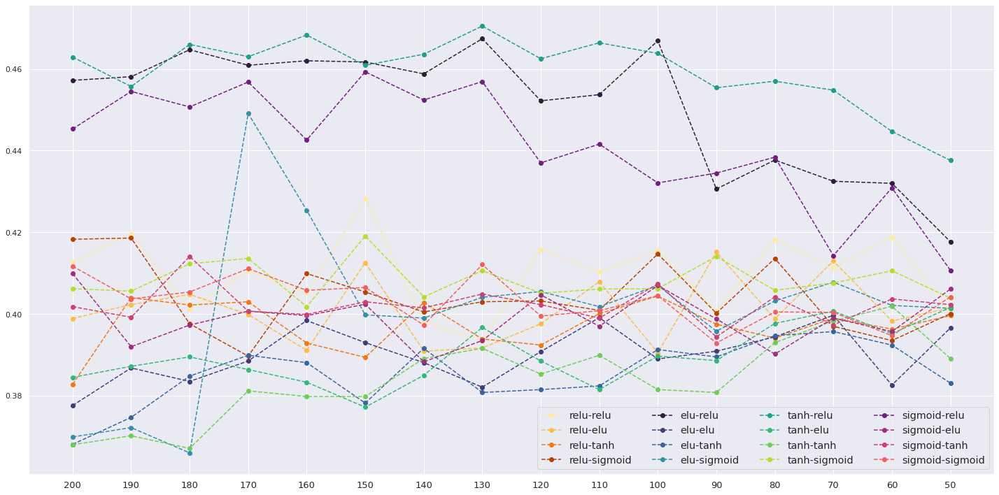

In [ ]:
print('Maximum value for the accuracy with first converter: {}'.format(np.max(store_acc)))
# which parameters?
print(np.where(store_acc == np.max(store_acc)))

# comparison of the accuracies with converter
plot_metrics_evolution(store_acc, AF, AF, ED)

#### Accuracy with normalized converter

Maximum value for the accuracy with normalized converter: 0.4798
(array([7]), array([3]))


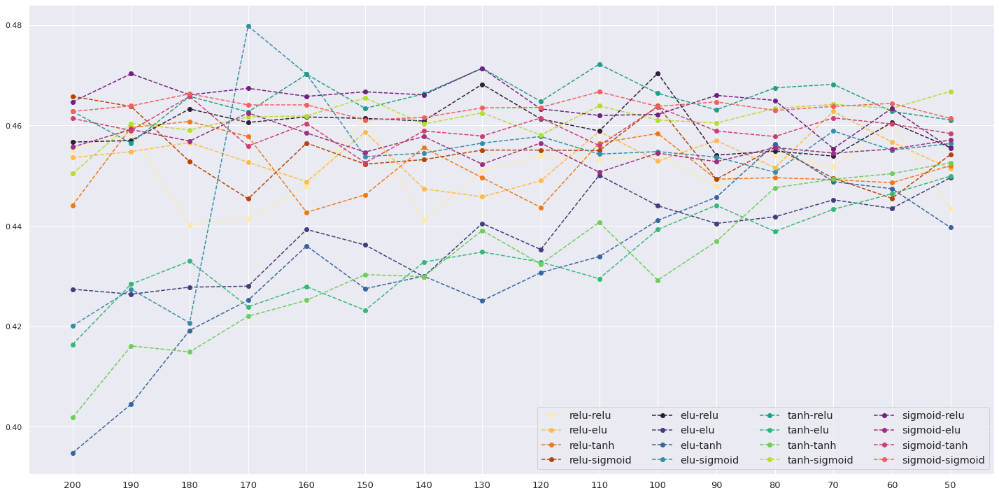

In [ ]:
print('Maximum value for the accuracy with normalized converter: {}'.format(np.max(store_accn)))
# which parameters?
print(np.where(store_accn == np.max(store_accn)))

# comparison of the accuracies with converter
plot_metrics_evolution(store_accn, AF, AF, ED)

#### Deviation without converter

Minimum value for the deviation without converter: 25.94
(array([10]), array([0]))


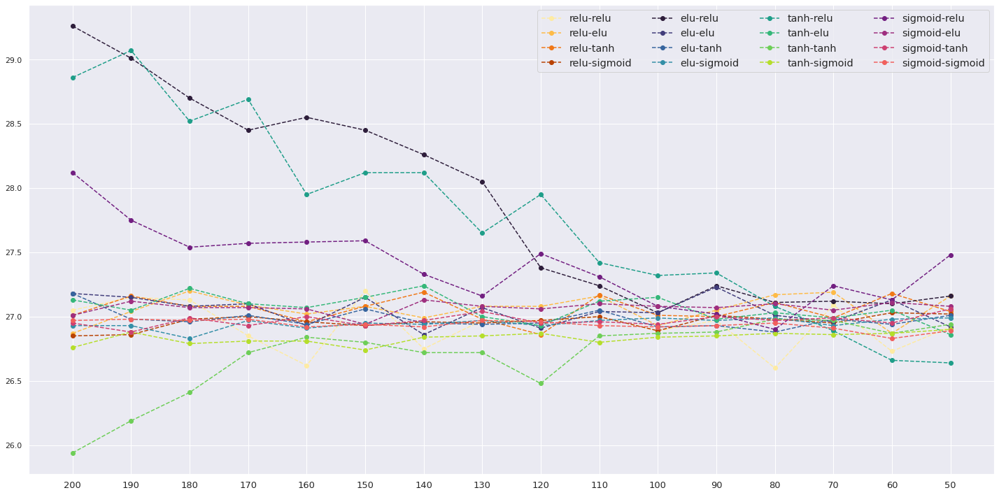

In [ ]:
print('Minimum value for the deviation without converter: {}'.format(np.min(store_dev0)))
# which parameters?
print(np.where(store_dev0 == np.min(store_dev0)))

# comparison of the deviations without any converter
plot_metrics_evolution(store_dev0, AF, AF, ED)

#### Deviation with first converter

Minimum value for the deviation with first converter: 22.12
(array([7]), array([3]))


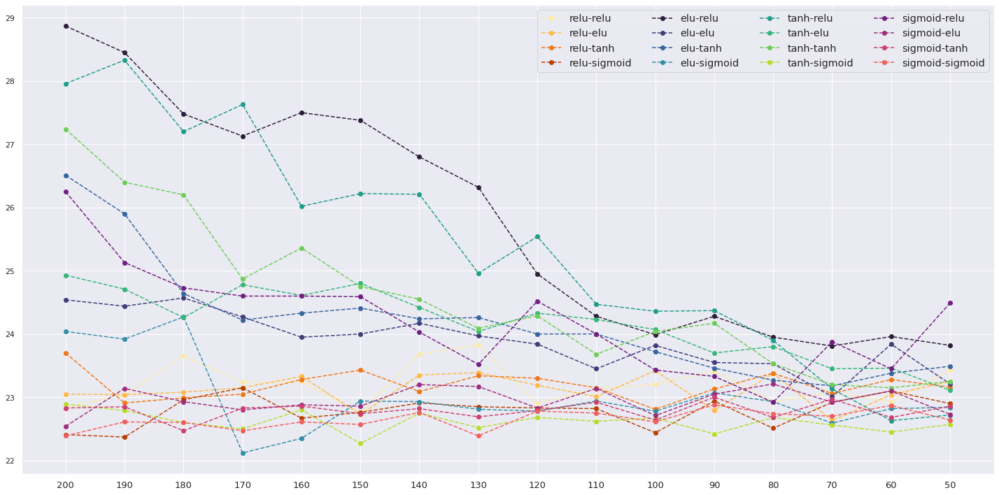

In [ ]:
print('Minimum value for the deviation with first converter: {}'.format(np.min(store_dev)))
# which parameters?
print(np.where(store_dev == np.min(store_dev)))

# comparison of the deviations with converter
plot_metrics_evolution(store_dev, AF, AF, ED)

#### Deviation with normalized converter

Minimum value for the deviation with normalized converter: 21.67
(array([15]), array([12]))


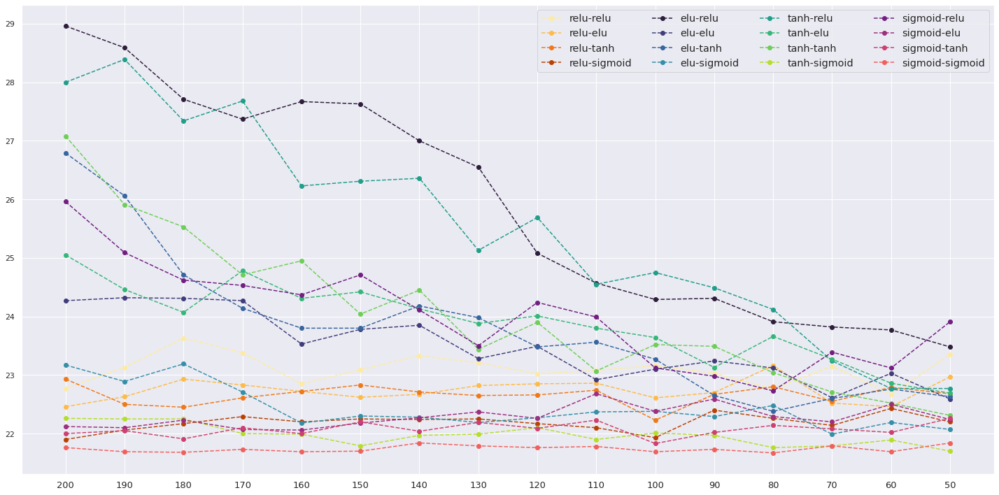

In [ ]:
print('Minimum value for the deviation with normalized converter: {}'.format(np.min(store_devn)))
# which parameters?
print(np.where(store_devn == np.min(store_devn)))

# comparison of the deviations with normalized converter
plot_metrics_evolution(store_devn, AF, AF, ED)

#### MSE

Minimum value for mse: 0.08400415629148483
(array([15]), array([5]))


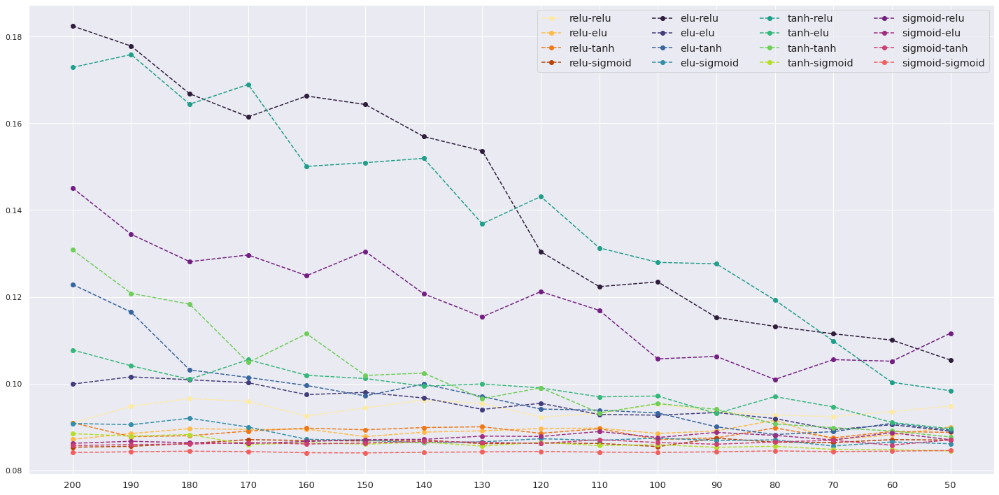

In [ ]:
print('Minimum value for mse: {}'.format(np.min(store_mse)))
# which parameters?
print(np.where(store_mse == np.min(store_mse)))

# comparison of the mse 
plot_metrics_evolution(store_mse, AF, AF, ED)

There are several optimal solutions to the reconstruction problem: some combinations of parameters return better accuracy, others optimize deviation or mean squared error. Furthermore, during the compilation phase the performance values may change compared to the previous one, with small fluctuations related to the choice of the initial values for the parameters during the training procedure. What is interesting to consider is that on average the second converter returns a better performance than the naive one. 

In particular, the most satisfactory models - that is, such as to achieve the best results considering one of the metrics evaluated - were the following:

In [ ]:
# best accuracy converter model 
print(np.where(store_acc  == np.max(store_acc)), np.max(store_acc))
# best accuracy normalized converter model 
print(np.where(store_accn == np.max(store_accn)), np.max(store_accn))

# best deviation no converter model 
print(np.where(store_dev0 == np.min(store_dev0)), np.min(store_dev0))
# best deviation converter model 
print(np.where(store_dev  == np.min(store_dev)), np.min(store_dev))
# best deviation normalized converter model 
print(np.where(store_devn == np.min(store_devn)), np.min(store_devn))

# best mse model 
print(np.where(store_mse  == np.min(store_mse)), np.min(store_mse))

(array([8]), array([7])) 0.4705
(array([7]), array([3])) 0.4798
(array([10]), array([0])) 25.94
(array([7]), array([3])) 22.12
(array([15]), array([12])) 21.67
(array([15]), array([5])) 0.08400415629148483


First argument gives the position in the list of af1-af2 combination, while the second one the position in the encoding dimension list, both of sixteen elements. 

We therefore choose to take as the best model the one that returns the best accuracy and the one that minimizes the deviation, both taking the normalized converter. 

In [ ]:
# best accuracy indeces
idx_act_fun_accn = np.where(store_accn == np.max(store_accn))[0][0]
idx_enc_dim_accn = np.where(store_accn == np.max(store_accn))[1][0]

# best deviation indeces
idx_act_fun_devn = np.where(store_devn == np.min(store_devn))[0][0]
idx_enc_dim_devn = np.where(store_devn == np.min(store_devn))[1][0]

Given the indices of the models selected as the best, let's compare their predictions in the following graph (the python function used is the same as in the first sections). In green the honest values of the test set while in orange the predictions of the model with the best accuracy, in blue with the minimum deviation.

We note how the second tends to reconstruct the questionnaire on average more faithfully, being in fact the one that minimizes the percentage difference between true values and predictions among all.

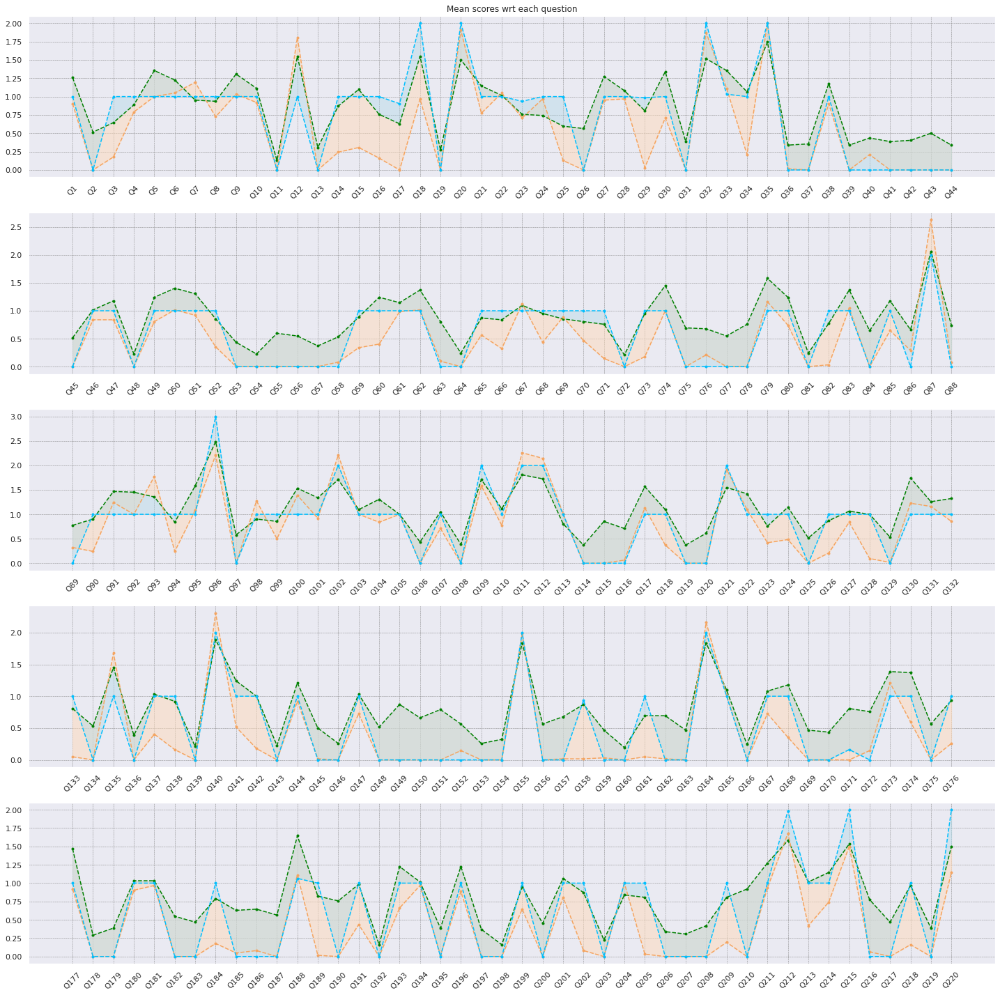

In [ ]:
# best accuracy, best deviation comparison
# orange, blue
plot_average_questions(xhtest*n, store_convn[idx_act_fun_accn][idx_enc_dim_accn], 
                       store_convn[idx_act_fun_devn][idx_enc_dim_devn], diff = [12])

In [ ]:
def plot_loss_autoencoder(history_l, P1, P2 = None, ncols = 2):
    '''
    This function plots loss and accuracy evolution through epochs 
    during the training procedure then it is associated to mse values 
    of the validation set 
    '''
    plt.figure(figsize = (20, 7))
    
    # this option is used to explore loss evolution wrt the only encoding dimension 
    if P2 == None: 
        # Plot loss
        K = np.shape(P1)[0]
        colors = sns.color_palette(None, K)
        
        plt.title('Train and Validation Loss by Epochs')
        plt.xlabel('Epochs', fontweight = 'bold', fontsize = 15)
        plt.ylabel('Loss', fontweight = 'bold', fontsize = 15)

        for i in range(0, K):
            plt.plot(history_l[i].history['loss'], label = 'Train Loss {}'.format(P1[i]), color = colors[i])
            plt.plot(history_l[i].history['val_loss'], 
                     label = 'Valid Loss {}'.format(P1[i]), color = colors[i], linestyle = ':')
            plt.legend(fontsize = 'small', ncol = ncols)
            
        plt.grid(color = 'gray', linestyle = '--', linewidth = 0.5)
        
        plt.show()
        
    # this option is used to explore loss evolution wrt the combination of two different activation functions 
    else:
        fold = []
        for p1 in P1:
            for p2 in P2: 
                fold.append('{}-{}'.format(p1, p2))
                
        K = np.shape(fold)[0]
        colors = sns.color_palette(None, K)
        
        # Plot loss
        plt.title('Train and Validation Loss by Epochs')
        plt.xlabel('Epochs', fontweight = 'bold', fontsize = 15)
        plt.ylabel('Loss', fontweight = 'bold', fontsize = 15)

        for i in range(0, K):
            plt.plot(history_l[i].history['loss'], label = 'Train Loss {}'.format(fold[i]), color = colors[i])
            plt.plot(history_l[i].history['val_loss'], 
                     label = 'Valid Loss {}'.format(fold[i]), color = colors[i], linestyle = ':')
            plt.legend(fontsize = 'large', ncol = ncols)
        
        plt.grid(color = 'gray', linestyle = '--', linewidth = 0.5)
        
        plt.show()

Below is an image showing how the sixteen models (one per encoding dimension) behave during the training phase with the combination of model activation functions that returns the lowest mse value on the test. 

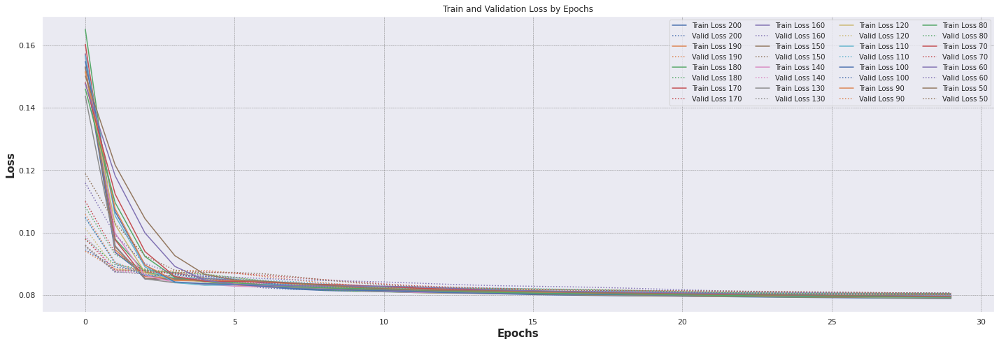

In [ ]:
# best mse indices
idx_act_fun_mse = np.where(store_mse == np.min(store_mse))[0][0]

# best model with minimum mse on validation set (through all the encoding dimension) 
plot_loss_autoencoder(store_hist[idx_act_fun_mse], ED, ncols = 4)

Since the distribution of the possible scores in the datasets is not homogeneous, the **confusion matrices** for the two chosen models are proposed below.

[Text(0, 0.5, '0'), Text(0, 1.5, '1'), Text(0, 2.5, '2'), Text(0, 3.5, '3')]

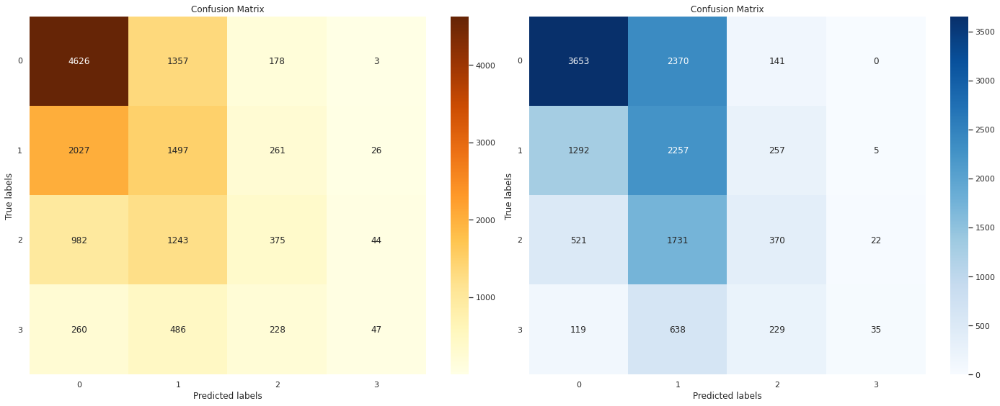

In [ ]:
# Make confusion matrix for best accuracy 
cm = confusion_matrix(np.concatenate(xhtest*n, axis=0), 
                      np.concatenate(store_convn[idx_act_fun_accn][idx_enc_dim_accn], axis=0))
labels = [0,1,2,3]

# Plot the confusion matrix
plt.rcParams.update({"font.size": 12})
fig, ax = plt.subplots(1, 2, figsize  = (20,8))

sns.heatmap(cm.astype('float'), annot=True, ax=ax[0], cmap="YlOrBr", fmt='g') 
# To show fractions, please uncomment the following line and comment the above
# sns.heatmap(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], annot=True, fmt='.2', ax=ax) 
ax[0].set_xlabel('Predicted labels')
ax[0].set_ylabel('True labels')
ax[0].set_title('Confusion Matrix')
ax[0].yaxis.set_ticklabels(labels, rotation=0)

# Make confusion matrix for best deviation 
cm = confusion_matrix(np.concatenate(xhtest*n, axis=0), 
                      np.concatenate(store_convn[idx_act_fun_devn][idx_enc_dim_devn], axis=0))
labels = [0,1,2,3]

sns.heatmap(cm.astype('float'), annot=True, ax=ax[1], cmap="Blues", fmt='g') 
# To show fractions, please uncomment the following line and comment the above
# sns.heatmap(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], annot=True, fmt='.2', ax=ax) 
ax[1].set_xlabel('Predicted labels')
ax[1].set_ylabel('True labels')
ax[1].set_title('Confusion Matrix')
ax[1].yaxis.set_ticklabels(labels, rotation=0)

## 6.4 Multi Output Classifier Training & Evaluation

The latest reconstruction proposal concerns your *multioutput classification* methods: Support Vector Machine (SVM) and logistic regression. To implement the templates we used the *MultiOutputClassifier* function offered by python combined with *SVC()* and *LogReg()*. 

For each of the classifiers we have studied the performances obtained considering three different input data:
- *raw original data*; 
- *tfidf scores* with procedure 1; 
- *tfidf scores* with procedure 2.

For these methods, the input of the classifier is again given by the falsified questionnaires (or the tfidf matrix evaluated on it) while the output is given directly by the reconstruction (honest scores in the training phase). 

The first step, as usual, consists in preparing the data: the dataset was immediately divided into training and test sets, respectively of dimensions $(350,220)$ and $(62, 220)$, for both input (dishonest) and response variable (honest). 

Subsequently the input data were prepared for the various modes, evaluating if needed the respective tfidf coefficients.

In [ ]:
# create honest train and test dataframe
dfh_train = data[data.target==0].iloc[:350,:220]
dfh_test  = data[data.target==0].iloc[350:,:220]

print(np.shape(dfh_train), np.shape(dfh_test))

# create dishonest train and test dataframe 
dfd_train = data[data.target==1].iloc[:350,:220]
dfd_test  = data[data.target==1].iloc[350:,:220]

print(np.shape(dfd_train), np.shape(dfd_test))

(350, 220) (62, 220)
(350, 220) (62, 220)


In [ ]:
# RESPONSE train and test (y variables given by the honest scores)
# they are used as labels for all the methods 
xhtrain = np.array(dfh_train)
xhtest  = np.array(dfh_test)

In [ ]:
# raw data 
# input train and test (x variables given by dishonest scores) 
xdtrain = np.array(dfd_train)
xdtest  = np.array(dfd_test)

In [ ]:
# tfidf PROCEDURE 1
# compute the tfidf and idf for honest train dataset
tfidfs_honest_train1, idfs_honest1 = compute_tf_idf(dfh_train)

# compute the tfidf for dishonest train
tfidfxdtrain1, _ = compute_tf_idf(dfd_train, idfs_honest1)
tfidfxdtest1 , _ = compute_tf_idf(dfd_test,  idfs_honest1)

In [ ]:
# tfidf PROCEDURE 2
tfidfs_honest_train2, idfs_honest2 = compute_tf_idf(dfh_train, procedure=2)

tfidfxdtrain2, _ = compute_tf_idf(dfd_train, idfs_honest2, procedure=2)
tfidfxdtest2 , _ = compute_tf_idf(dfd_test,  idfs_honest2, procedure=2)

In [ ]:
# check dimensionality: input vs output data for three procedures

# train  np.shape(tfidfxdtrain1),
print(np.shape(xdtrain),  np.shape(tfidfxdtrain2))
print(np.shape(xhtrain))

# test  np.shape(tfidfxdtest1),
print(np.shape(xdtest),  np.shape(tfidfxdtest2))
print(np.shape(xhtest))

(350, 220) (350, 220)
(350, 220)
(62, 220) (62, 220)
(62, 220)


#### Some useful functions
To evaluate the performances and also calculate some metrics, let us consider two new functions. The first one returns the confusion matrix for the successful attempts, the other one compares the results of the predictions with the true values ​​of the test composed of the honest ones. The criterion followed for the representation is the same as in the previous sections. In particular, the average responses for all players to a specific question are considered.

In [ ]:
def conf_matrix(LST, LST_names, colors = ['Reds', 'Greens', 'Blues']):
  labels = [0,1,2,3]
    
  # set plot parameters 
  plt.rcParams.update({"font.size": 12})
  fig, ax = plt.subplots(1, 3, figsize  = (20,5))

  # evaluate confusion matrices for each element in LST 
  for prd in range(np.shape(LST)[0]):
    cm = confusion_matrix(np.concatenate(xhtest, axis=0), np.concatenate(PRD[prd], axis=0))
    
    sns.heatmap(cm.astype('float'), annot=True, ax=ax[prd], cmap=colors[prd], fmt='g') 
    
    # some settings 
    ax[prd].set_xlabel('Predicted')
    ax[prd].set_ylabel('True')
    ax[prd].set_title(PRD_names[prd])
    ax[prd].yaxis.set_ticklabels(labels, rotation=0)

In [ ]:
def plot_average_quest(LST, colors = ['green', 'orange', 'cyan', 'purple'], num_fig = 5, num_qst = 44, ticks = True, fig_size = (20,20)):

    fig, axes = plt.subplots(num_fig, figsize = fig_size) 
    
    # average scores over all the subjects
    means_per_question = pd.DataFrame([np.mean(LST[i], axis=0) for i in range(np.shape(LST)[0])])
    means_per_question.columns = ['Q{}'.format(qst) for qst in range(1, 221)]
    
    for idx in range(0,num_fig):
      for lst in range(np.shape(LST)[0]):

        # select the right curve (means for an element in LST )
        lst_mean = means_per_question.loc[lst]
        # plot the curve 
        axes[idx].plot(lst_mean[idx*num_qst:(idx+1)*num_qst], '--bo', color = colors[lst])

      axes[idx].grid(color = 'gray', linestyle = '--', linewidth = 0.5)
      if ticks == True:
        plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation=45)
      else:
        plt.setp(axes[idx].xaxis.get_majorticklabels(), rotation=90)        
    

    axes[0].set_title('Means wrt each question for the various patients')
    plt.show()

#### Support Vector Machine


In [ ]:
# create basic model for SVM
model_svm = MultiOutputClassifier(SVC())

In [ ]:
# input given by original raw data 
model_svm0 = model_svm.fit(xdtrain, xhtrain)
prediction_svm0 = model_svm0.predict(xdtest)
print('Overall accuracy: {}'.format(overall_accuracy(xhtest, prediction_svm0)))
print('Deviation       : {}'.format(deviation(xhtest, prediction_svm0)))

Overall accuracy: 0.4846
Deviation       : 23.48


In [ ]:
# input given by tfidf on dishonest (procedure 1)
model_svm1 = model_svm.fit(tfidfxdtrain1, xhtrain)
prediction_svm1 = model_svm1.predict(tfidfxdtest1)
print('Overall accuracy: {}'.format(overall_accuracy(xhtest, prediction_svm1)))
print('Deviation       : {}'.format(deviation(xhtest, prediction_svm1)))

Overall accuracy: 0.4827
Deviation       : 23.66


In [ ]:
# input given by tfidf on dishonest (procedure 2)
model_svm2 = model_svm.fit(tfidfxdtrain2, xhtrain)
prediction_svm2 = model_svm2.predict(tfidfxdtest2)
print('Overall accuracy: {}'.format(overall_accuracy(xhtest, prediction_svm2)))
print('Deviation       : {}'.format(deviation(xhtest, prediction_svm2)))

Overall accuracy: 0.4798
Deviation       : 23.73


Observing the correctly reconstructed values ​​we notice that most of them concern the lowest score, which represents the class most returned by the classifiers. In this sense, it is influenced by the composition of the data, which mainly presents the first two scores. In general, the results of the three approaches are similar to each other, although evaluating metrics such as accuracy and deviation the best model turned out to be the first one with raw data.

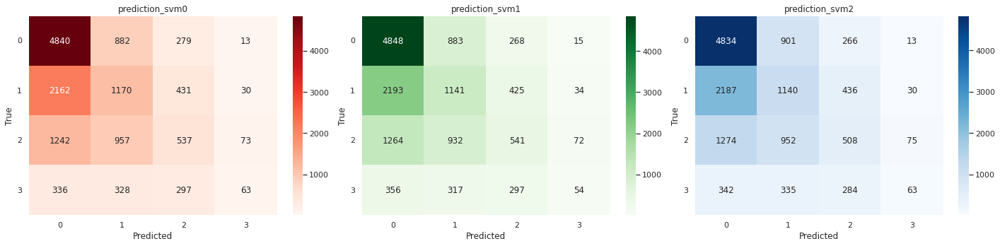

In [ ]:
# set useful lists 
PRD_names = ['prediction_svm0', 'prediction_svm1', 'prediction_svm2']
PRD = [prediction_svm0, prediction_svm1, prediction_svm2]
conf_matrix(PRD, PRD_names)

The following graph compares the true values ​​(honest scores in green) and the three predictions, in the order given by orange, light blue and purple.

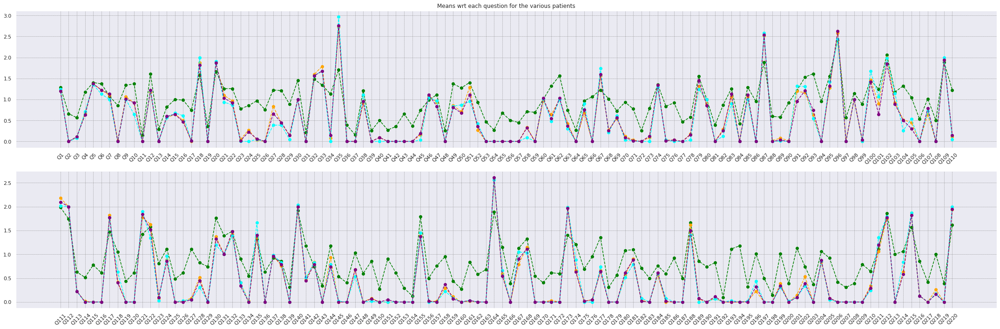

In [ ]:
plot_average_quest([xhtest, prediction_svm0, prediction_svm1, prediction_svm2], num_fig=2, num_qst=110, fig_size=(30,10))

#### Logistic regression 
For the latter method the procedure followed is the same as for the SVM classifier, so each model will be evaluated in metrics, performance and reconstruction.

In [ ]:
model_lr = MultiOutputClassifier(LogisticRegression())

In [ ]:
model_lr0 = model_lr.fit(xdtrain, xhtrain)
prediction_lr0 = model_lr0.predict(xdtest)
print('Overall accuracy: {}'.format(overall_accuracy(xhtest, prediction_lr0)))
print('Deviation       : {}'.format(deviation(xhtest, prediction_lr0)))

Overall accuracy: 0.3945
Deviation       : 28.05


In [ ]:
model_lr1 = model_lr.fit(tfidfxdtrain1, xhtrain)
prediction_lr1 = model_lr1.predict(tfidfxdtest1)
print('Overall accuracy: {}'.format(overall_accuracy(xhtest, prediction_lr1)))
print('Deviation       : {}'.format(deviation(xhtest, prediction_lr1)))

Overall accuracy: 0.3948
Deviation       : 28.55


In [ ]:
model_lr2 = model_lr.fit(tfidfxdtrain2, xhtrain)
prediction_lr2 = model_lr2.predict(tfidfxdtest2)
print('Overall accuracy: {}'.format(overall_accuracy(xhtest, prediction_lr2)))
print('Deviation       : {}'.format(deviation(xhtest, prediction_lr2)))

Overall accuracy: 0.3886
Deviation       : 28.85


In this case, the classifier is not excessively unbalanced in predicting elements of the last class but returns to a greater extent higher scores even if they are not always correctly classified. This could explain the decrease in accuracies. In fact, observing the reconstructions (image in the next cell) it is found that on average they are able to better describe the real values.

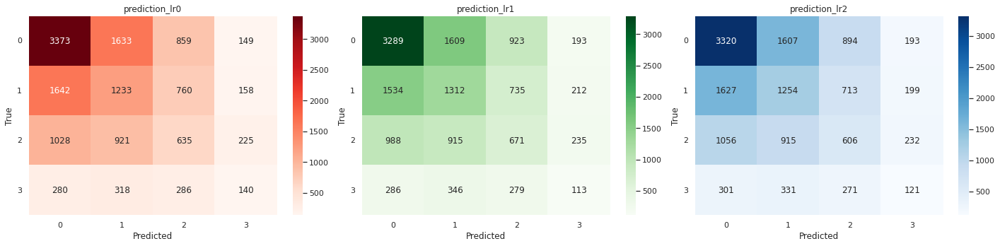

In [ ]:
# set useful lists 
PRD_names = ['prediction_lr0', 'prediction_lr1', 'prediction_lr2']
PRD = [prediction_lr0, prediction_lr1, prediction_lr2]
conf_matrix(PRD, PRD_names)

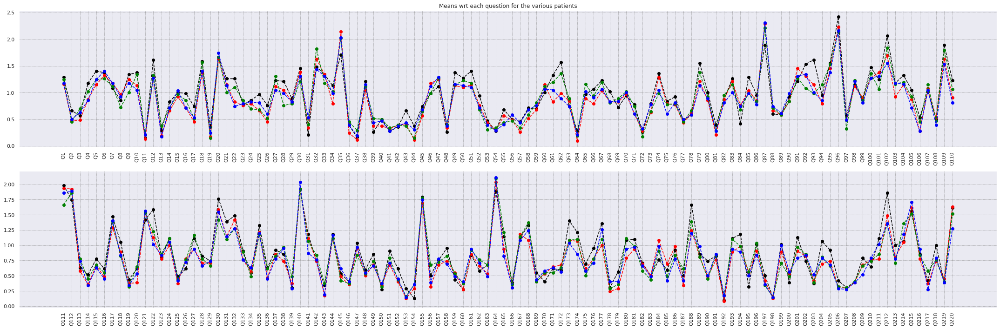

In [ ]:
plot_average_questions([xhtest, prediction_lr0, prediction_lr1, prediction_lr2], num_fig=2, num_qst=110, fig_size=(30,10), ticks = False)

#### 6.5 Overall Reconstruction Results Analysis 
We therefore also conclude this section dedicated to reconstruction by summarizing the main results for each approach. 

The model based on differences, although naive, is able to return good predictions and in a consistent way whatever the subdivision of the dataset. The average accuracy is equal to 33% and a deviation of 31%. 

The denoiser greatly improves the quality of predictions and the performance on metrics. There are two models that have returned the best results, in both cases using the normalized converter: considering the accuracy we obtain 47.98%,
while evaluating the deviation on test we get 21.67%. 

With the SVM method, 48.46% for the accuracy and 23.48% for the deviation are reached using raw data as input.

Finally, the logistic regression returns 39.45% and 28.05% for accuracy and deviation. The positive aspect of this classifier compared to the previous one was the ability to predict higher classes.


#### Concluding Points
##### Summary Points and Remarks
- It would be ideal to have some more examples of all kinds of responses. This will allow us to have a more representable sample of the population. For now most likely the results would not be the most effective with new real world data

- Many of the 5 psychological domains are highly correlated with each other. This makes segmentation of the above responses much harder. Would be interesting to see how each diagnosed psychological domain would respond and compare.

- Another potential intersting future experiment would be to only have features with the sub domains from the personality inventory. We could then perform heirarchical clustering and unsupervised learning to find common areas between patients.